# 0.Carga de archivo

**Autor:** Jesús Oviedo Riquelme

[Github](https://github.com/jesusoviedo/clustering_func_publico)

[Fuente de los datos](https://datos.hacienda.gov.py/data/nomina)

[Diccionario de los datos](https://datos.hacienda.gov.py/def/nomina)

[Enlace de acceso a los datos](https://drive.google.com/file/d/1p-S_Tle9ISpSmyvrTjmzHi7Ton0ieapi/view?usp=sharing)





**Instalo librerias a utilizarce en el cuaderno**

In [1]:
!pip install category-encoders

**Importo las librerias a utilizar a lo largo del cuaderno**

In [2]:
# librerias para manejar fechas
import datetime as dt

# librerias para manipular dataset y trabajar con matices
import numpy as np
import pandas as pd

# librerias para graficos
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import missingno as msno

# librerias de seleccion y preprocesamiento de atributos
from sklearn.feature_selection import VarianceThreshold
from sklearn.preprocessing import StandardScaler
from category_encoders import CountEncoder

# librerias de visualización de clustering
from yellowbrick.cluster import KElbowVisualizer
from yellowbrick.cluster import SilhouetteVisualizer

# librerias de clustering
from sklearn.cluster import KMeans
from sklearn.cluster import BisectingKMeans

# metricas
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics import davies_bouldin_score
from sklearn.metrics import silhouette_score

**Creo un Dataframe a partir de la lectura de un archivo**

*Entrada: URL del archivo csv que contiene la nómina de funcionarios públicos del periodo 2023-07, el formato de compresión del archivo y codificación del archivo a leer*

*Salida: dataframe con los datos de los funcionarios públicos del periodo 2023-07*

*   [read_csv](https://pandas.pydata.org/docs/reference/api/pandas.read_csv.html#pandas.read_csv)

In [3]:
file_id = '1p-S_Tle9ISpSmyvrTjmzHi7Ton0ieapi'
url = f'https://drive.google.com/uc?id={file_id}&export=download'

df_nomina_funcionario = pd.read_csv(url, compression='zip', encoding='latin-1')

<ipython-input-3-4fa87c9d4629>:4: DtypeWarning: Columns (18,28) have mixed types. Specify dtype option on import or set low_memory=False.
  df_nomina_funcionario = pd.read_csv(url, compression='zip', encoding='latin-1')


**Creo una copia del DataFrame de la nómina de funcionarios a ser utilizada en la etapa del Preprocesamiento de datos**

*Entrada: dataframe de la nómina de funcionarios*

*Salida: dataframe que es una copia del Dataframe de la nómina de funcionarios*

*   [copy](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.copy.html)
*   [head](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.head.html)


In [4]:
df_pre_nomina_funcionario = df_nomina_funcionario.copy()
df_pre_nomina_funcionario.head(5)

,anio,mes,codigoNivel,descripcionNivel,codigoEntidad,descripcionEntidad,codigoPrograma,descripcionPrograma,codigoSubprograma,descripcionSubprograma,...,montoDevengado,mesCorte,anioCorte,fechaCorte,nivelAbr,entidadAbr,programaAbr,subprogramaAbr,proyectoAbr,unidadAbr
0,2023,7,12,12-PODER EJECUTIVO,7,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,1,001 - PROGRAMA CENTRAL,0,0 - *,...,3632977,9,2023,2023-09-05,PODER EJECUTIVO,MEC,PC,*,BSETCEEBYEM,VEPAGE
1,2023,7,12,12-PODER EJECUTIVO,7,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,1,001 - PROGRAMA CENTRAL,0,0 - *,...,698249,9,2023,2023-09-05,PODER EJECUTIVO,MEC,PC,*,AG,DGA
2,2023,7,12,12-PODER EJECUTIVO,7,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,1,001 - PROGRAMA CENTRAL,0,0 - *,...,227520,9,2023,2023-09-05,PODER EJECUTIVO,MEC,PC,*,AG,DGA
3,2023,7,12,12-PODER EJECUTIVO,7,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,1,001 - PROGRAMA CENTRAL,0,0 - *,...,3632977,9,2023,2023-09-05,PODER EJECUTIVO,MEC,PC,*,BSEPSCEEB,VEPAGE
4,2023,7,12,12-PODER EJECUTIVO,7,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,1,001 - PROGRAMA CENTRAL,0,0 - *,...,3632977,9,2023,2023-09-05,PODER EJECUTIVO,MEC,PC,*,BSEPSCEEB,VEPAGE


# 1.EAD - Análisis Exploratorio de Datos

## 1.1 Vision general

**Visualizo las primeras filas del DataFrame de la nómina de funcionarios**

*Entrada: número de filas a mostrar del DataFrame*

*Salida: N registro del DataFrame en base al número ingresado como entrada*

*   [head](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.head.html)

In [5]:
df_nomina_funcionario.head(10)

,anio,mes,codigoNivel,descripcionNivel,codigoEntidad,descripcionEntidad,codigoPrograma,descripcionPrograma,codigoSubprograma,descripcionSubprograma,...,montoDevengado,mesCorte,anioCorte,fechaCorte,nivelAbr,entidadAbr,programaAbr,subprogramaAbr,proyectoAbr,unidadAbr
0,2023,7,12,12-PODER EJECUTIVO,7,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,1,001 - PROGRAMA CENTRAL,0,0 - *,...,3632977,9,2023,2023-09-05,PODER EJECUTIVO,MEC,PC,*,BSETCEEBYEM,VEPAGE
1,2023,7,12,12-PODER EJECUTIVO,7,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,1,001 - PROGRAMA CENTRAL,0,0 - *,...,698249,9,2023,2023-09-05,PODER EJECUTIVO,MEC,PC,*,AG,DGA
2,2023,7,12,12-PODER EJECUTIVO,7,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,1,001 - PROGRAMA CENTRAL,0,0 - *,...,227520,9,2023,2023-09-05,PODER EJECUTIVO,MEC,PC,*,AG,DGA
3,2023,7,12,12-PODER EJECUTIVO,7,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,1,001 - PROGRAMA CENTRAL,0,0 - *,...,3632977,9,2023,2023-09-05,PODER EJECUTIVO,MEC,PC,*,BSEPSCEEB,VEPAGE
4,2023,7,12,12-PODER EJECUTIVO,7,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,1,001 - PROGRAMA CENTRAL,0,0 - *,...,3632977,9,2023,2023-09-05,PODER EJECUTIVO,MEC,PC,*,BSEPSCEEB,VEPAGE
5,2023,7,12,12-PODER EJECUTIVO,7,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,1,001 - PROGRAMA CENTRAL,0,0 - *,...,240000,9,2023,2023-09-05,PODER EJECUTIVO,MEC,PC,*,AG,DGA
6,2023,7,12,12-PODER EJECUTIVO,7,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,1,001 - PROGRAMA CENTRAL,0,0 - *,...,182406,9,2023,2023-09-05,PODER EJECUTIVO,MEC,PC,*,AG,DGA
7,2023,7,12,12-PODER EJECUTIVO,7,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,1,001 - PROGRAMA CENTRAL,0,0 - *,...,307692,9,2023,2023-09-05,PODER EJECUTIVO,MEC,PC,*,BSEPSCEEB,VEPAGE
8,2023,7,12,12-PODER EJECUTIVO,7,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,1,001 - PROGRAMA CENTRAL,0,0 - *,...,307692,9,2023,2023-09-05,PODER EJECUTIVO,MEC,PC,*,BSEPSCEEB,VEPAGE
9,2023,7,12,12-PODER EJECUTIVO,7,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,1,001 - PROGRAMA CENTRAL,0,0 - *,...,615384,9,2023,2023-09-05,PODER EJECUTIVO,MEC,PC,*,BSETCEEBYEM,VEPAGE


**Muestro las dimensiones del DataFrame de la nómina de funcionarios**

*Entrada: tupla que contiene el número de filas y columnas del DataFrame*

*Salida: cadena de texto indicando la cantidad de filas y columnas que tiene el DataFrame*

*   [shape](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.shape.html)
*   [print](https://docs.python.org/3/library/functions.html#print)
*   [f-strings](https://docs.python.org/3/reference/lexical_analysis.html#f-strings)

In [6]:
dimension = df_nomina_funcionario.shape
print(f"El data frame contiene {dimension[0]} filas y {dimension[1]} columnas")

El data frame contiene 1113704 filas y 40 columnas


**Cuento los valores duplicados en el Dataframe de la nómina de funcionarios**

*Entrada: dataframe de la nómina de funcionarios*

*Salida: cadena de texto indicando la cantidad de valores duplicados en el dataframe*

*   [duplicated](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.duplicated.html)
*   [sum](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.sum.html)
*   [print](https://docs.python.org/3/library/functions.html#print)
*   [f-strings](https://docs.python.org/3/reference/lexical_analysis.html#f-strings)

In [7]:
print(f"El Dataframe tiene {df_nomina_funcionario.duplicated().sum()} registros duplicados")

El Dataframe tiene 248425 registros duplicados


**Observación 1.1.1**

> Los registros duplicados serán tratados en el punto 2, en la sección de Eliminación de filas y variables. Las filas duplicadas pueden introducir ruido, sesgo y distorsión.

**Muestro las columnas que contiene el Dataframe de la nómina de funcionarios**

*Entrada: índice que contiene el nombre de las columnas del Dataframe*

*Salida: lista que contien el nombre de las columnas del Dataframe*

*   [columns](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.columns.html#)

In [8]:
atributos = df_nomina_funcionario.columns
list(atributos)

['anio',
 'mes',
 'codigoNivel',
 'descripcionNivel',
 'codigoEntidad',
 'descripcionEntidad',
 'codigoPrograma',
 'descripcionPrograma',
 'codigoSubprograma',
 'descripcionSubprograma',
 'codigoProyecto',
 'descripcionProyecto',
 'codigoUnidadResponsable',
 'descripcionUnidadResponsable',
 'codigoObjetoGasto',
 'conceptoGasto',
 'fuenteFinanciamiento',
 'linea',
 'codigoPersona',
 'nombres',
 'apellidos',
 'sexo',
 'discapacidad',
 'codigoCategoria',
 'cargo',
 'horasCatedra',
 'fechaIngreso',
 'tipoPersonal',
 'lugar',
 'montoPresupuestado',
 'montoDevengado',
 'mesCorte',
 'anioCorte',
 'fechaCorte',
 'nivelAbr',
 'entidadAbr',
 'programaAbr',
 'subprogramaAbr',
 'proyectoAbr',
 'unidadAbr']

**Muestro información de completitud y tipo de datos que contiene el Dataframe de la nómina de funcionarios**

*Salida: impresion de  un resumen de las columnas, la cantidad de valores no null y el tipo de dato de las columnas del Dataframe*

*   [info](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.info.html)

In [9]:
df_nomina_funcionario.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1113704 entries, 0 to 1113703
Data columns (total 40 columns):
 #   Column                        Non-Null Count    Dtype  
---  ------                        --------------    -----  
 0   anio                          1113704 non-null  int64  
 1   mes                           1113704 non-null  int64  
 2   codigoNivel                   1113704 non-null  int64  
 3   descripcionNivel              1113704 non-null  object 
 4   codigoEntidad                 1113704 non-null  int64  
 5   descripcionEntidad            1113704 non-null  object 
 6   codigoPrograma                1113704 non-null  int64  
 7   descripcionPrograma           1113704 non-null  object 
 8   codigoSubprograma             1113704 non-null  int64  
 9   descripcionSubprograma        1113704 non-null  object 
 10  codigoProyecto                1113704 non-null  int64  
 11  descripcionProyecto           1113704 non-null  object 
 12  codigoUnidadResponsable     

**Creo un Dataframe que contenga dos columnas (nombre de la variable y tipo de dato) a partir del Dataframe de la nómina de funcionarios**

*Entrada: serie que contiene el tipo de dato de cada columna del Dataframe y el nombre de las columnas*

*Salida: dataframe con las columnas variable y tipo*

*   [dtypes](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.dtypes.html)
*   [reset_index](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.reset_index.html)
*   [head](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.head.html)

In [10]:
df_tipo_col_nomina = pd.DataFrame(df_nomina_funcionario.dtypes, columns=["Tipo"]).reset_index(names=["Variable"])
df_tipo_col_nomina.head()

,Variable,Tipo
0,anio,int64
1,mes,int64
2,codigoNivel,int64
3,descripcionNivel,object
4,codigoEntidad,int64


**Resumen de los tipos de datos del Dataframe de la nómina de funcionarios**

*Entrada: dataframe con las columnas variable y tipo (creados en el punto anterior), titulo del grafico, leyendas para los ejes X e Y*

*Salida: histograma que muestra el tipo de dato (eje X) y la cantidad de variables para ese tipo (eje Y)*

*   [astype](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.astype.html)
*   [subplot](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.subplot.html)
*   [title](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.title.html)
*   [xlabel](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.xlabel.html)
*   [ylabel](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.ylabel.html)
*   [show](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.show.html)

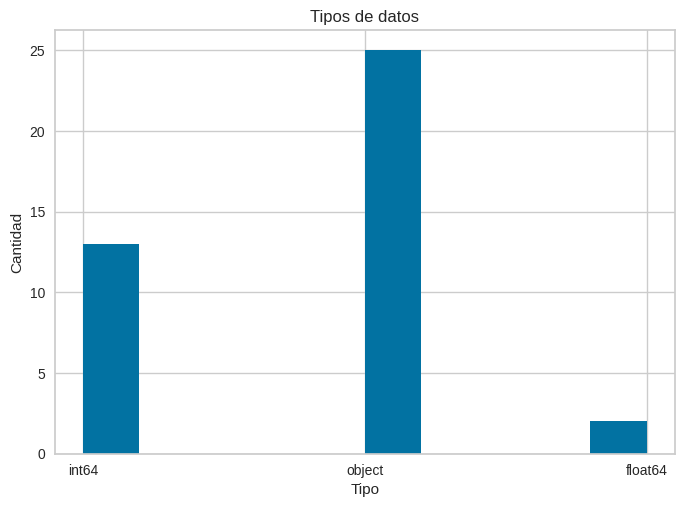

In [11]:
fig, ax = plt.subplots()

ax.hist(df_tipo_col_nomina["Tipo"].astype(str))
plt.title("Tipos de datos")
plt.xlabel("Tipo")
plt.ylabel("Cantidad")
plt.show()

**Muestro un listado de las variables de tipo object del Dataframe de la nómina de funcionarios**

*Entrada: dataframe de la nómina de funcionarios*

*Salida: dataframe que contiene aquellas variables cuyo tipo sea object*


*   [subset_data](https://pandas.pydata.org/docs/getting_started/intro_tutorials/03_subset_data.html)

In [12]:
df_tipo_col_nomina[df_tipo_col_nomina["Tipo"] == "object"]

,Variable,Tipo
3,descripcionNivel,object
5,descripcionEntidad,object
7,descripcionPrograma,object
9,descripcionSubprograma,object
11,descripcionProyecto,object
13,descripcionUnidadResponsable,object
15,conceptoGasto,object
16,fuenteFinanciamiento,object
18,codigoPersona,object
19,nombres,object


**Muestro un listado de las variables de tipo int del Dataframe de la nómina de funcionarios**

*Entrada: dataframe de la nómina de funcionarios*

*Salida: dataframe que contiene aquellas variables cuyo tipo sea int*

*   [subset_data](https://pandas.pydata.org/docs/getting_started/intro_tutorials/03_subset_data.html)

In [13]:
df_tipo_col_nomina[df_tipo_col_nomina["Tipo"] == "int64"]


,Variable,Tipo
0,anio,int64
1,mes,int64
2,codigoNivel,int64
4,codigoEntidad,int64
6,codigoPrograma,int64
8,codigoSubprograma,int64
10,codigoProyecto,int64
12,codigoUnidadResponsable,int64
14,codigoObjetoGasto,int64
29,montoPresupuestado,int64


**Muestro un listado de las variables de tipo float del Dataframe de la nómina de funcionarios**

*Entrada: dataframe de la nómina de funcionarios*

*Salida: dataframe que contiene aquellas variables cuyo tipo sea float*

*   [subset_data](https://pandas.pydata.org/docs/getting_started/intro_tutorials/03_subset_data.html)

In [14]:
df_tipo_col_nomina[df_tipo_col_nomina["Tipo"] == "float64"]

,Variable,Tipo
17,linea,float64
25,horasCatedra,float64


## 1.2 Valores faltantes

**Creo un Dataframe que contenga el nombre de la variable, cantidad registros/filas, cantidad de valores null, porcentaje de valores null y tipo de dato a partir de la información del Dataframe de la nómina de funcionarios**

*Entrada: tenemos multiples entradas las cuales son (1) una serie que contiene la suma de valores null del Dataframe de la nómina de funcionarios, (2) numero de fillas del Dataframe de la nómina de funcionarios, (3) calculo del porcentaje de valores null usando un dataframe que contiene las entradas de los puntos 1 y 2; y (4) un dataframe que contiene el nombre de las variables y su tipo de dato*

*Salida: dataframe con las siguientes columnas variable, cantidad null, cantidad total, 	porcentaje null y tipo*

*   [isnull](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.isnull.html)
*   [sum](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.sum.html)
*   [dataframe](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.html)
*   [dictionaries](https://docs.python.org/3/tutorial/datastructures.html#dictionaries)
*   [reset_index](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.reset_index.html)
*   [add_columns](https://pandas.pydata.org/docs/getting_started/intro_tutorials/05_add_columns.html#)
*   [round](https://docs.python.org/3/library/functions.html#round)
*   [join](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.join.html)
*   [drop](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.drop.html)
*   [head](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.head.html)

In [15]:
cant_null = df_nomina_funcionario.isnull().sum()
cant_total = dimension[0]
resumen_columnas = pd.DataFrame(dict({"CantidadNull": cant_null, "CantidadTotal": cant_total})).reset_index(names=['Variable'])
resumen_columnas["PorcentajeNull"] = round(resumen_columnas["CantidadNull"] / resumen_columnas["CantidadTotal"], 3) * 100
resumen_columnas = resumen_columnas.join(df_tipo_col_nomina, rsuffix='_other').drop(columns=['Variable_other'])
resumen_columnas.head()

,Variable,CantidadNull,CantidadTotal,PorcentajeNull,Tipo
0,anio,0,1113704,0.0,int64
1,mes,0,1113704,0.0,int64
2,codigoNivel,0,1113704,0.0,int64
3,descripcionNivel,0,1113704,0.0,object
4,codigoEntidad,0,1113704,0.0,int64


**Muestro un listado de las variables del Dataframe de la nómina de funcionario que no tienen valores faltantes**

*Entrada: dataframe que contiene un resumen de las columnas, tipos, cantidades y porcentaje de valores null*

*Salida: dataframe de entrada que contiene solo aquellas filas cuyas cantidades de null sean 0*

*   [subset_data](https://pandas.pydata.org/docs/getting_started/intro_tutorials/03_subset_data.html)

In [16]:
resumen_columnas[resumen_columnas["CantidadNull"] == 0]

,Variable,CantidadNull,CantidadTotal,PorcentajeNull,Tipo
0,anio,0,1113704,0.0,int64
1,mes,0,1113704,0.0,int64
2,codigoNivel,0,1113704,0.0,int64
3,descripcionNivel,0,1113704,0.0,object
4,codigoEntidad,0,1113704,0.0,int64
5,descripcionEntidad,0,1113704,0.0,object
6,codigoPrograma,0,1113704,0.0,int64
7,descripcionPrograma,0,1113704,0.0,object
8,codigoSubprograma,0,1113704,0.0,int64
9,descripcionSubprograma,0,1113704,0.0,object


**Muestro un listado de las variables del Dataframe de la nómina de funcionario que tienen valores faltantes**

*Entrada: dataframe que contiene un resumen de las columnas, tipos, cantidades y porcentaje de valores null*

*Salida: dataframe de entrada que contiene solo aquellas filas cuyas cantidades de null sean mayores a 0*

*   [subset_data](https://pandas.pydata.org/docs/getting_started/intro_tutorials/03_subset_data.html)

In [17]:
resumen_columnas[resumen_columnas["CantidadNull"] > 0]

,Variable,CantidadNull,CantidadTotal,PorcentajeNull,Tipo
17,linea,71217,1113704,6.4,float64
24,cargo,643,1113704,0.1,object
25,horasCatedra,1113704,1113704,100.0,float64
28,lugar,1109117,1113704,99.6,object


**Observación 1.2.1**

> Recordemos que el lugar describe el Organismo y Entidad del estado del cual es originario el funcionario en Comisión de Servicio. Este campo sólo es pertinente si el movimiento corresponde a traslados temporales o definitivos. Se procederá a eliminar esta columna ya que imputar un valor implica que el 99.6 % de los registros tendrán el mismo valor. Misma acción se realizara para la columna horasCatedra ya que tiene un 100% de valores faltantes.



**Observación 1.2.2**

> Recordemos que la línea se refiere al código presupuestario asignado a una categoría en la Ley de Presupuesto General de la Nación. Se procederá a imputar un valor negativo para indicar que los registro no tienen asignado una línea.


**Gráfico de barra de valores no null por variable del Dataframe de la nómina de funcionario**

*Entrada: dataframe de la nómina de funcionario*

*Salida: grafico de barra que contiene las variables (eje x) y la cantidad de valores no null (eje y)*

*   [bar](https://github.com/ResidentMario/missingno#bar)

<Axes: >

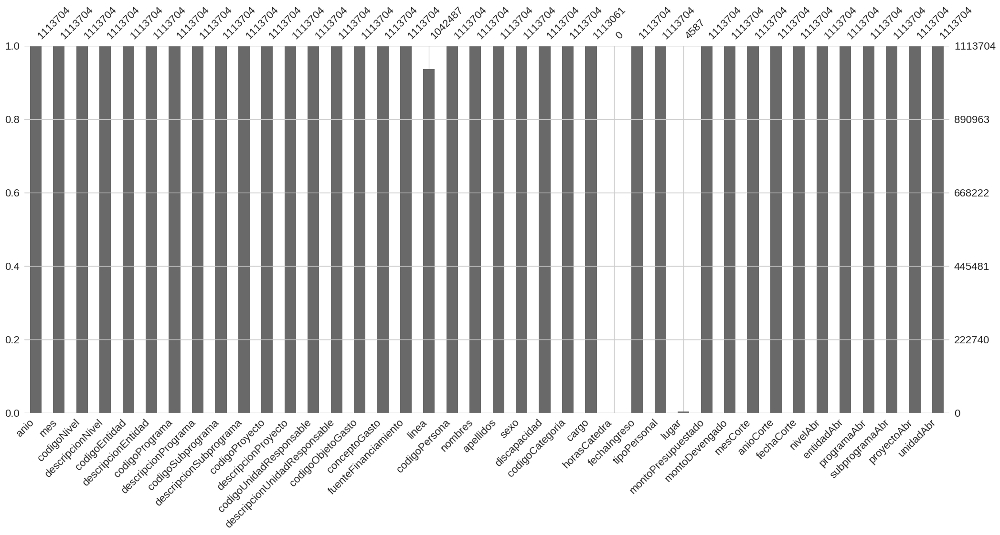

In [18]:
msno.bar(df_nomina_funcionario)

**Matrix de valores faltantes por variable del Dataframe de la nómina de funcionario**

*Entrada: dataframe de la nómina de funcionario*

*Salida: matrix que contiene las variables (eje x) y las secciones/filas (eje y) en las cuales hay valores faltantes (las que no están rellenas con un color)*

*   [matrix](https://github.com/ResidentMario/missingno#matrix)


<Axes: >

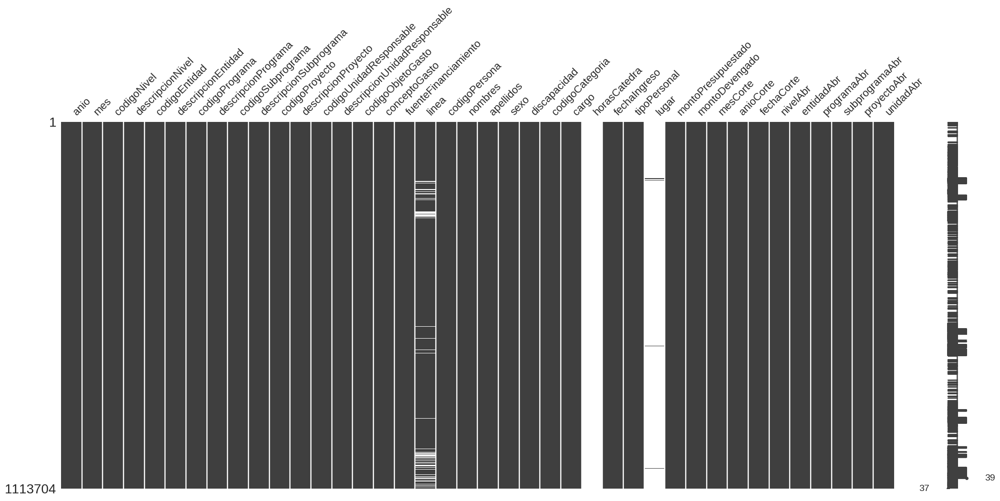

In [19]:
msno.matrix(df_nomina_funcionario)

**Mapa de calor de las variables con valores faltantes del Dataframe de la nómina de funcionario**

*Entrada: dataframe de la nómina de funcionario*

*Salida: mapa de calor que muestra las correlaciones entre las variables con valores faltantes del Dataframe de la nómina de funcionario*

*   [heatmap](https://github.com/ResidentMario/missingno#heatmap)

<Axes: >

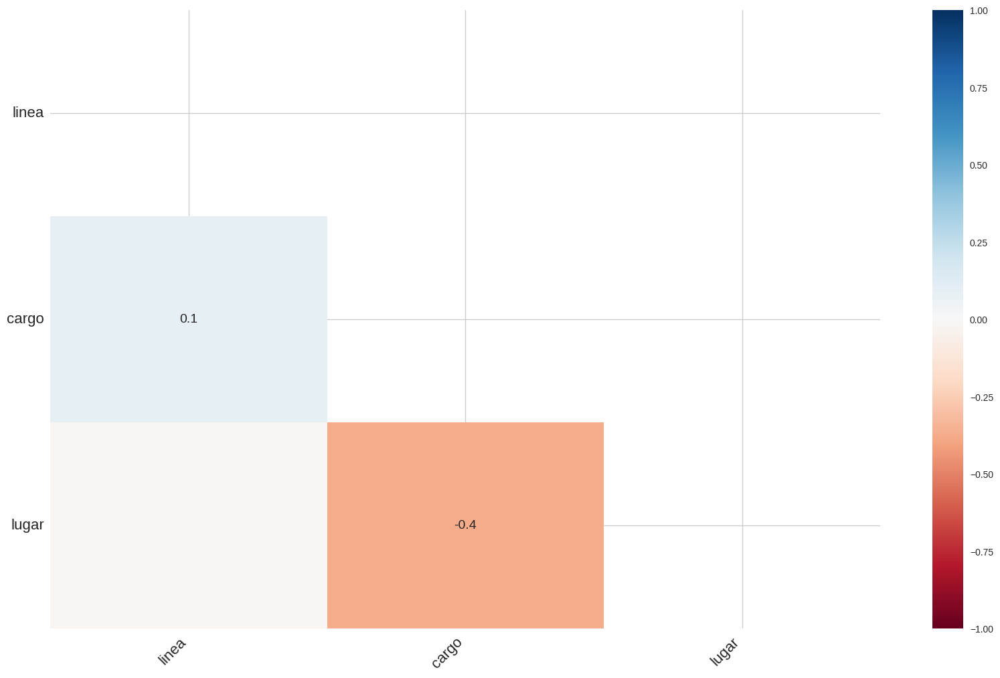

In [20]:
msno.heatmap(df_nomina_funcionario)

## 1.3 Estadistica descriptiva

**Mostramos un resumen de las estadísticas descriptivas de las variables numéricas del DataFrame de la nómina de funcionarios**

*Entrada: dataframe de la nómina de funcionarios que contiene las variables numéricas a las cuales queremos aplicar las estadísticas descriptivas*

*Salida: dataframe con las estadísticas descriptivas*

*   [describe](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.describe.html)
*   [t](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.T.html)


In [21]:
df_nomina_funcionario.describe().T

,count,mean,std,min,25%,50%,75%,max
anio,1113704.0,2.023000e+03,0.000000e+00,2023.0,2023.0,2023.0,2023.0,2023.0
mes,1113704.0,7.000000e+00,0.000000e+00,7.0,7.0,7.0,7.0,7.0
codigoNivel,1113704.0,1.304543e+01,3.807586e+00,11.0,12.0,12.0,12.0,28.0
codigoEntidad,1113704.0,6.345312e+00,3.320320e+00,1.0,5.0,7.0,7.0,39.0
codigoPrograma,1113704.0,1.083616e+00,3.650558e-01,1.0,1.0,1.0,1.0,7.0
codigoSubprograma,1113704.0,0.000000e+00,0.000000e+00,0.0,0.0,0.0,0.0,0.0
codigoProyecto,1113704.0,6.509411e+00,1.058772e+01,1.0,2.0,3.0,4.0,66.0
codigoUnidadResponsable,1113704.0,3.344455e+01,5.459453e+01,1.0,4.0,25.0,43.0,414.0
codigoObjetoGasto,1113704.0,1.278679e+02,3.521022e+01,111.0,111.0,111.0,133.0,849.0
linea,1042487.0,2.570436e+02,4.396271e+02,1.0,54.0,121.0,362.0,4900.0


**Mostramos un resumen de las estadisticas descriptivas de las variables no numericas del DataFrame de la nómina de funcionarios**

*Entrada: dataframe de la nómina de funcionarios que contiene las variables no numéricas a las cuales queremos aplicar las estadísticas descriptivas y listado del tipo de dato de las variables no numericas*

*Salida: dataframe con las estadísticas descriptivas*

*   [describe](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.describe.html)
*   [t](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.T.html)


In [22]:
df_nomina_funcionario.describe(include=[object]).T

,count,unique,top,freq
descripcionNivel,1113704,7,12-PODER EJECUTIVO,984836
descripcionEntidad,1113704,70,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,606176
descripcionPrograma,1113704,24,001 - PROGRAMA CENTRAL,1024288
descripcionSubprograma,1113704,1,0 - *,1113704
descripcionProyecto,1113704,465,004-BRINDAR SERVICIO EDUCATIVO EN EL TERCER CI...,233705
descripcionUnidadResponsable,1113704,266,43-VICEMINISTERIO DE EDUCACIÓN BÁSICA,455573
conceptoGasto,1113704,34,111-SUELDOS,632202
fuenteFinanciamiento,1113704,3,10-RECURSOS DEL TESORO,1079965
codigoPersona,1113704,268498,2454169,63
nombres,1113704,82676,JULIO CESAR,5187


Los resultado del analisis detallado de estas dos estadisticas descriptivas se observan en los puntos 1.4, 1.5, 1.6, 1.7, 1.8 y 1.9

## 1.4 Variables con valores únicos


**Graficamos las variables del DataFrame de la nómina de funcionarios que poseen cardinalidad 1**

*Entrada: número de filas, numero de columnas, tamaño del gráfico, título de cada subgráfico y la columna del DataFrame de la nómina de funcionarios a utilizarse como fuente para dibujar el subgráfico*

*Salida: subgráficos de histogramas*

*   [subplots](https://matplotlib.org/stable/gallery/subplots_axes_and_figures/subplots_demo.html)
*   [hist](https://matplotlib.org/stable/gallery/statistics/hist.html#)
*   [value_counts](https://pandas.pydata.org/docs/reference/api/pandas.Series.value_counts.html)

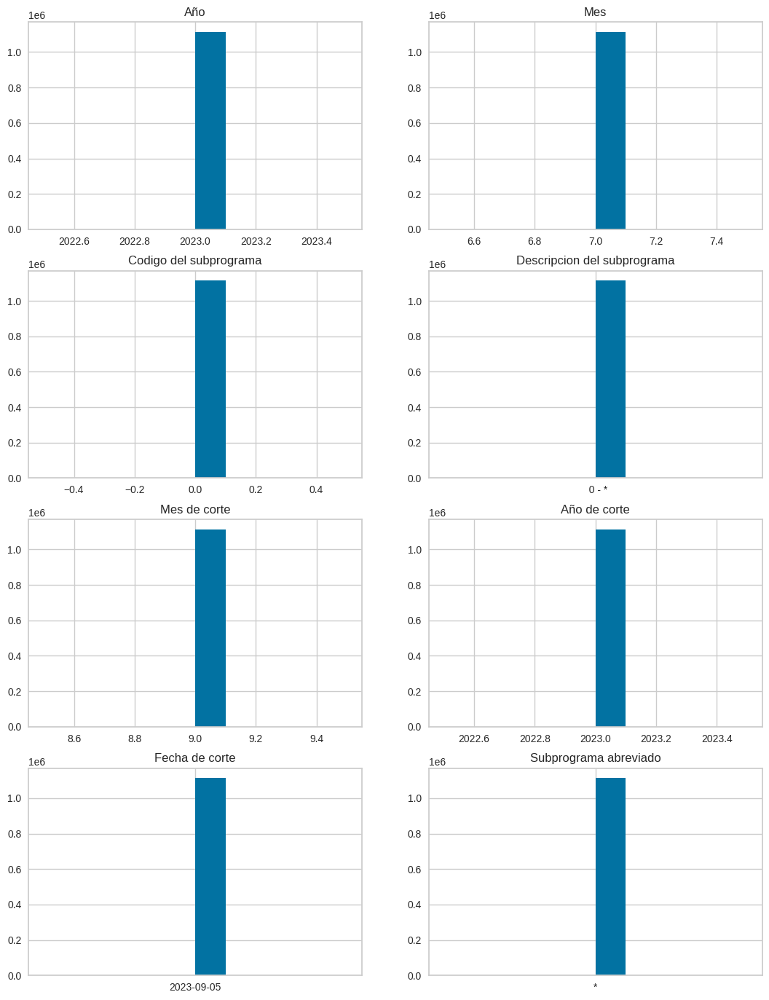

In [23]:
fig, axs = plt.subplots(4, 2, figsize=(13, 17))

axs[0, 0].set_title('Año')
axs[0, 0].hist(df_nomina_funcionario["anio"])

axs[0, 1].set_title('Mes')
axs[0, 1].hist(df_nomina_funcionario["mes"])

axs[1, 0].set_title('Codigo del subprograma')
axs[1, 0].hist(df_nomina_funcionario["codigoSubprograma"])

axs[1, 1].set_title('Descripcion del subprograma')
axs[1, 1].hist(df_nomina_funcionario["descripcionSubprograma"])

axs[2, 0].set_title('Mes de corte')
axs[2, 0].hist(df_nomina_funcionario["mesCorte"])

axs[2, 1].set_title('Año de corte')
axs[2, 1].hist(df_nomina_funcionario["anioCorte"])

axs[3, 0].set_title('Fecha de corte')
axs[3, 0].hist(df_nomina_funcionario["fechaCorte"])

axs[3, 1].set_title('Subprograma abreviado')
axs[3, 1].hist(df_nomina_funcionario["subprogramaAbr"])

plt.show()

**Guardo el listado de las variables del DataFrame de la nómina de funcionarios que poseen cardinalidad 1**

*Entrada: nombre de las variables del DataFrame de la nómina de funcionarios con cardinalidad 1*

*Salida: lista de las variables del DataFrame de la nómina de funcionarios con cardinalidad 1*

*   [list](https://docs.python.org/3/library/functions.html#func-list)

In [24]:
list_constantes = ["anio", "mes", "codigoSubprograma", "descripcionSubprograma", "mesCorte", "anioCorte", "fechaCorte", "subprogramaAbr"]
list_constantes

['anio',
 'mes',
 'codigoSubprograma',
 'descripcionSubprograma',
 'mesCorte',
 'anioCorte',
 'fechaCorte',
 'subprogramaAbr']

**Observación 1.4.1**

> Las variables con valores únicos serán tratados en el punto 2, en la sección de Eliminación de filas y variables. Estas variables no aportan ninguna información útil para el análisis o el modelado de machine learning, ya que no tienen variabilidad ni relación con otras variables.

## 1.5 Variables con alta cardinalidad

**Mostramos los valores únicos que contienen las variables del DataFrame de la nómina de funcionarios con alta cardinalidad**

*Entrada: array de numpy que contiene los valores únicos de las columnas del DataFrame de la nómina de funcionarios con alta cardinalidad*

*Salida: mensaje que indica el nombre de la columna y la cantidad de valores únicos que contiene la misma*

*   [unique](https://pandas.pydata.org/docs/reference/api/pandas.unique.html)
*   [len](https://docs.python.org/3/library/functions.html#len)
*   [print](https://docs.python.org/3/library/functions.html#print)

In [25]:
valores_unicos = len(df_nomina_funcionario["codigoPersona"].unique())
print(f"La variable codigo de persona tiene {valores_unicos:,} valores unicos")

valores_unicos = len(df_nomina_funcionario["apellidos"].unique())
print(f"La variable apellidos tiene {valores_unicos:,} valores unicos")

valores_unicos = len(df_nomina_funcionario["nombres"].unique())
print(f"La variable nombres tiene {valores_unicos:,} valores unicos")

valores_unicos = len(df_nomina_funcionario["fechaIngreso"].unique())
print(f"La variable fecha de ingreso tiene {valores_unicos:,} valores unicos")

valores_unicos = len(df_nomina_funcionario["cargo"].unique())
print(f"La variable cargo tiene {valores_unicos:,} valores unicos")

valores_unicos = len(df_nomina_funcionario["codigoCategoria"].unique())
print(f"La variable codigo categoria tiene {valores_unicos:,} valores unicos")

valores_unicos = len(df_nomina_funcionario["lugar"].unique())
print(f"La variable lugar tiene {valores_unicos:,} valores unicos")

La variable codigo de persona tiene 268,498 valores unicos
La variable apellidos tiene 107,156 valores unicos
La variable nombres tiene 82,676 valores unicos
La variable fecha de ingreso tiene 7,250 valores unicos
La variable cargo tiene 2,383 valores unicos
La variable codigo categoria tiene 1,963 valores unicos
La variable lugar tiene 75 valores unicos


**Guardo el listado de variables del DataFrame de la nómina de funcionarios que tienen alta cardinalidad**

*Entrada: nombre de las variables del DataFrame de la nómina de funcionarios con alta cardinalidad*

*Salida: lista de variables del DataFrame de la nómina de funcionarios con alta cardinalidad*

*   [list](https://docs.python.org/3/library/functions.html#func-list)

In [26]:
list_var_alta_cardinalidad = ["codigoPersona", "apellidos", "nombres", "fechaIngreso", "cargo", "codigoCategoria", "lugar"]
list_var_alta_cardinalidad

['codigoPersona',
 'apellidos',
 'nombres',
 'fechaIngreso',
 'cargo',
 'codigoCategoria',
 'lugar']

**Guardo el listado de variables del DataFrame de la nómina de funcionarios que tienen alta cardinalidad pero son irrelevantes**

*Entrada: nombre de las variables del DataFrame de la nómina de funcionarios con alta cardinalidad irrelevantes*

*Salida: lista de variables del DataFrame de la nómina de funcionarios con alta cardinalidad irrelevantes*

*   [list](https://docs.python.org/3/library/functions.html#func-list)

In [27]:
list_var_alta_cardinalidad_irrelevantes = ["codigoPersona", "apellidos", "nombres"]

**Observación 1.5.1**

> Los variables con valores que no son relevantes serán tratados en el punto 2, en la sección de Eliminación de filas y variables. Estas variables no reflejan ninguna característica o atributo de interés para el problema planteado.

## 1.6 Variables redundantes

**Mostramos las variables que son redundantes en el DataFrame de la nómina de funcionarios (grupo 1)**

*Entrada: tres Dataframe que contiene cada uno un resumen de las cantidades agrupadas por valores. Se usa la cantidad como clave para realizar un join*

*Salida: mensaje que indica las variables con sus valores únicos y un Dataframe que muestra la equivalencia entre las variables*

*   [unique](https://pandas.pydata.org/docs/reference/api/pandas.unique.html)
*   [len](https://docs.python.org/3/library/functions.html#len)
*   [print](https://docs.python.org/3/library/functions.html#print)
*   [dataframe](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.html)
*   [value_counts](https://pandas.pydata.org/docs/reference/api/pandas.Series.value_counts.html)
*   [reset_index](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.reset_index.html)
*   [join](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.join.html)
*   [drop](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.drop.html)






In [28]:
valores_unicos = len(df_nomina_funcionario["codigoNivel"].unique())
print(f"La variable codigo de nivel tiene {valores_unicos:,} valores unicos")

valores_unicos = len(df_nomina_funcionario["descripcionNivel"].unique())
print(f"La variable descripcion del nivel tiene {valores_unicos:,} valores unicos")

valores_unicos = len(df_nomina_funcionario["nivelAbr"].unique())
print(f"La variable nivel arbeviado tiene {valores_unicos:,} valores unicos")

df_cant = pd.DataFrame({"Cantidad": df_nomina_funcionario["codigoNivel"].value_counts()}).reset_index(names=['CodigoNivel'])
df_desc = pd.DataFrame({"Cantidad": df_nomina_funcionario["descripcionNivel"].value_counts()}).reset_index(names=['DescripcionNivel'])
df_abr = pd.DataFrame({"Cantidad": df_nomina_funcionario["nivelAbr"].value_counts()}).reset_index(names=['NivelAbreviado'])
df_var_redundantes = df_cant.join(df_desc, rsuffix='_other').drop(columns=['Cantidad_other']).join(df_abr, rsuffix='_other').drop(columns=['Cantidad_other'])

df_var_redundantes[["Cantidad", "CodigoNivel", "DescripcionNivel", "NivelAbreviado"]]

La variable codigo de nivel tiene 7 valores unicos
La variable descripcion del nivel tiene 7 valores unicos
La variable nivel arbeviado tiene 7 valores unicos


,Cantidad,CodigoNivel,DescripcionNivel,NivelAbreviado
0,984836,12,12-PODER EJECUTIVO,PODER EJECUTIVO
1,62731,28,28-UNIVERSIDADES NACIONALES,UNIVERSIDADES NAC.
2,47464,13,13-PODER JUDICIAL Y ORGANISMOS AUXILIARES DE J...,P.JUD. ORG.AUX. JUST
3,10230,23,23-ENTES AUTÓNOMOS Y AUTÁRQUICOS,ENTES AUTÓN.Y AUTÁRQ
4,5544,11,11-PODER LEGISLATIVO,PODER LEGISLATIVO
5,2546,14,14-CONTRALORÍA GENERAL DE LA REPÚBLICA,CONTRALORÍA
6,353,15,15-OTROS ORGANISMOS DEL ESTADO,OEE


**Observación 1.6.1**

> Las variables CodigoNivel, DescripcionNivel y NivelAbreviado aportan la misma información, pero usando diferentes tipos de datos. Variable seleccionada: CodigoNivel






**Mostramos las variables que son redundantes en el DataFrame de la nómina de funcionarios (grupo 2)**

*Entrada: cantidad de valores únicos para tres columnas del DataFrame de la nómina de funcionarios*

*Salida: mensaje que indica las variables con sus valores únicos*

*   [unique](https://pandas.pydata.org/docs/reference/api/pandas.unique.html)
*   [len](https://docs.python.org/3/library/functions.html#len)
*   [print](https://docs.python.org/3/library/functions.html#print)


In [29]:
valores_unicos = len(df_nomina_funcionario["codigoEntidad"].unique())
print(f"La variable codigo de entidad tiene {valores_unicos:,} valores unicos")

valores_unicos = len(df_nomina_funcionario["descripcionEntidad"].unique())
print(f"La variable descripcion de entidad tiene {valores_unicos:,} valores unicos")

valores_unicos = len(df_nomina_funcionario["entidadAbr"].unique())
print(f"La variable entidad arbeviada tiene {valores_unicos:,} valores unicos")

La variable codigo de entidad tiene 36 valores unicos
La variable descripcion de entidad tiene 70 valores unicos
La variable entidad arbeviada tiene 70 valores unicos


**Muestro los valores únicos y cantidades para el codigoEntidad del DataFrame de la nómina de funcionarios**

*Entrada: diccionario que contiene la cantidad de valores únicos*

*Salida: dataframe que contiene los valores únicos del codigoEntidad y sus cantidades*

*   [dataframe](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.html)
*   [value_counts](https://pandas.pydata.org/docs/reference/api/pandas.Series.value_counts.html)
*   [reset_index](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.reset_index.html)
*   [head](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.head.html)



In [30]:
df_cant = pd.DataFrame({"Cantidad": df_nomina_funcionario["codigoEntidad"].value_counts()}).reset_index(names=['CodigoEntidad'])
df_cant.head()

,CodigoEntidad,Cantidad
0,7,608930
1,3,130250
2,8,121431
3,5,96691
4,1,71359


**Mostramos un Dataframe de equivalencia entre las variables descripcionEntidad y entidadAbr**

*Entrada: dos Dataframe que contiene cada uno un resumen de las cantidades agrupadas por valores para las variables descripcionEntidad y entidadAbr. Se usa la cantidad como clave para realizar un join*

*Salida: dataframe que muestra la equivalencia entre las variables descripcionEntidad y entidadAbr*

*   [dataframe](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.html)
*   [value_counts](https://pandas.pydata.org/docs/reference/api/pandas.Series.value_counts.html)
*   [reset_index](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.reset_index.html)
*   [join](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.join.html)
*   [drop](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.drop.html)



In [31]:
df_desc = pd.DataFrame({"Cantidad": df_nomina_funcionario["descripcionEntidad"].value_counts()}).reset_index(names=['DescripcionEntidad'])
df_abr = pd.DataFrame({"Cantidad": df_nomina_funcionario["entidadAbr"].value_counts()}).reset_index(names=['EntidadAbreviada'])
df_var_redundantes = df_desc.join(df_abr, rsuffix='_other').drop(columns=['Cantidad_other'])
df_var_redundantes[["Cantidad", "DescripcionEntidad", "EntidadAbreviada"]]

,Cantidad,DescripcionEntidad,EntidadAbreviada
0,606176,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,MEC
1,120275,008-MINISTERIO DE SALUD PÚBLICA Y BIENESTAR SO...,MSPYBS
2,108435,003-MINISTERIO DEL INTERIOR,MI
3,94366,005-MINISTERIO DE DEFENSA NACIONAL,MDN
4,44012,001-UNIVERSIDAD NACIONAL DE ASUNCIÓN,UNA
...,...,...,...
65,64,029-CONSEJO NACIONAL DE EDUCACIÓN SUPERIOR,CONES
66,54,013-ENTE REGULADOR DE SERVICIOS SANITARIOS,ERSSAN
67,44,"035-DIRECCIÓN NACIONAL DE DEFENSA, SALUD Y BIE...",DNDSYA
68,20,037-INSTITUTO NACIONAL DEL AUDIOVISUAL PARAGUAYO,INAP


**Observación 1.6.2**

> La variable CodigoEntidad esta más acotada que las otras dos (DescripcionEntidad, EntidadAbreviada). Es un punto para consultar a Hacienda ya que se esperaba que tanto el código, descripción y entidad abreviada tengan las mismas cantidades de valores únicos.





**Observación 1.6.3**

> Las variables DescripcionEntidad y EntidadAbreviada aportan la misma información, pero usando diferentes tipos de datos. Variable seleccionada: DescripcionEntidad.



**Mostramos las variables que son redundantes en el DataFrame de la nómina de funcionarios (grupo 3)**

*Entrada: cantidad de valores únicos para tres columnas del DataFrame de la nómina de funcionarios*

*Salida: mensaje que indica las variables con sus valores únicos*

*   [unique](https://pandas.pydata.org/docs/reference/api/pandas.unique.html)
*   [len](https://docs.python.org/3/library/functions.html#len)
*   [print](https://docs.python.org/3/library/functions.html#print)

In [32]:
valores_unicos = len(df_nomina_funcionario["codigoPrograma"].unique())
print(f"La variable codigo de programa tiene {valores_unicos:,} valores unicos")

valores_unicos = len(df_nomina_funcionario["descripcionPrograma"].unique())
print(f"La variable descripcion del programa tiene {valores_unicos:,} valores unicos")

valores_unicos = len(df_nomina_funcionario["programaAbr"].unique())
print(f"La variable programa arbeviado tiene {valores_unicos:,} valores unicos")

La variable codigo de programa tiene 7 valores unicos
La variable descripcion del programa tiene 24 valores unicos
La variable programa arbeviado tiene 37 valores unicos


**Muestro los valores únicos y cantidades para el CodigoPrograma del DataFrame de la nómina de funcionarios**

*Entrada: diccionario que contiene la cantidad de valores únicos*

*Salida: dataframe que contiene los valores únicos del CodigoPrograma y sus cantidades ordenadas de menor a mayor codigo*

*   [dataframe](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.html)
*   [value_counts](https://pandas.pydata.org/docs/reference/api/pandas.Series.value_counts.html)
*   [reset_index](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.reset_index.html)
*   [sort_values](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.sort_values.html)



In [33]:
df_cant = pd.DataFrame({"Cantidad": df_nomina_funcionario["codigoPrograma"].value_counts()}).reset_index(names=['CodigoPrograma'])
df_cant.sort_values(by=['CodigoPrograma'])

,CodigoPrograma,Cantidad
0,1,1033749
1,2,75038
2,3,2324
6,4,206
5,5,309
4,6,885
3,7,1193


**Muestro el código contenido en la variable descripcionPrograma del Dataframe de la nómina de funcionarios**

*Entrada: dataframe que contiene un resumen de las cantidades agrupadas por los valores de la variable descripcionPrograma**

*Salida: dataframe que contiene los valores únicos de la variable descripcionPrograma, sus cantidades y un código numérico extraído el cual está contenido en la variable descripcionPrograma ordenadas de menor a mayor código extraído*

*   [dataframe](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.html)
*   [value_counts](https://pandas.pydata.org/docs/reference/api/pandas.Series.value_counts.html)
*   [reset_index](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.reset_index.html)
*   [split](https://pandas.pydata.org/docs/reference/api/pandas.Series.str.split.html)
*   [astype](https://pandas.pydata.org/docs/reference/api/pandas.Series.astype.html)
*   [sort_values](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.sort_values.html)


In [34]:
df_desc = pd.DataFrame({"Cantidad": df_nomina_funcionario["descripcionPrograma"].value_counts()}).reset_index(names=['DescripcionPrograma'])
df_desc["codigo_extraido"] = df_desc['DescripcionPrograma'].str.split("-").str[0].astype("int64")
df_desc.sort_values(by=['codigo_extraido'])

,DescripcionPrograma,Cantidad,codigo_extraido
0,001 - PROGRAMA CENTRAL,1024288,1
21,001 - RED VIAL PAVIMENTADA INCREMENTADA,24,1
18,001 - MEJORA DE PRODUCTIVIDAD DE SISTEMAS DE P...,72,1
16,001 - PROTECCIÓN DE LA NIÑEZ Y ADOLESCENCIA,142,1
12,001 - ADMINISTRACION GENERAL,678,1
10,001 - SOLUCIONES HABITACIONALES ADECUADAS,764,1
9,001 - CONTROL MIGRATORIO EN EL TERRITORIO NACI...,823,1
11,001 - MEJORA DE LA FORMACION Y CAPACITACION LA...,762,1
3,001 - ACCESO A LA ATENCIÓN PRIMARIA DE LA SALUD,5270,1
7,001 - PROTECCION SOCIAL A FAMILIAS EN SITUACIO...,926,1


**Muestro la agrupación del código extraído y la suma de las cantidades**

*Entrada: dataframe creado en el punto anterior (df_desc)*

*Salida: dataframe que contiene la agrupación del código extraído y la suma de las cantidades por este código extraído*

*   [groupby](https://pandas.pydata.org/pandas-docs/stable/user_guide/groupby.html)


In [35]:
df_desc.groupby("codigo_extraido").agg({"Cantidad": "sum"})

,Cantidad
codigo_extraido,
1,1033749
2,75038
3,2324
4,206
5,309
6,885
7,1193


**Muestro los valores únicos y cantidades para el programaAbr del DataFrame de la nómina de funcionarios**

*Entrada: diccionario que contiene la cantidad de valores únicos*

*Salida: dataframe que contiene los valores únicos del programaAbr y sus cantidades*

*   [dataframe](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.html)
*   [value_counts](https://pandas.pydata.org/docs/reference/api/pandas.Series.value_counts.html)
*   [reset_index](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.reset_index.html)


In [36]:
df_abr = pd.DataFrame({"Cantidad": df_nomina_funcionario["programaAbr"].value_counts()}).reset_index(names=['ProgramaAbreviado'])
df_abr

,ProgramaAbreviado,Cantidad
0,PC,937028
1,SHRM,63121
2,PCSS,47125
3,AC,11626
4,EDLTJ,8486
5,AAP,5270
6,CENTRAL,5148
7,PROG. CTRAL.,3495
8,P.C.,3242
9,SNPP,3234


**Observación 1.6.4**

> Las variables CodigoPrograma, DescripcionPrograma y ProgramaAbreviado no coinciden en la cantidad de valores únicos.  No obstante, se visualiza un patrón de código en la variable de DescripcionPrograma, el cual agrupamos por este código extraído y como resultado tenemos coincidencia de cantidad de valores únicos entre las variables CodigoPrograma y DescripcionPrograma. Para la variable ProgramaAbreviado no encontramos un patrón.


**Observación 1.6.5**

> Las variable DescripcionPrograma aporta más información detallada sobre los programas. Variable seleccionada: DescripcionPrograma.


**Mostramos las variables que son redundantes en el DataFrame de la nómina de funcionarios (grupo 4)**

*Entrada: cantidad de valores únicos para tres columnas del DataFrame de la nómina de funcionarios*

*Salida: mensaje que indica las variables con sus valores únicos*

*   [unique](https://pandas.pydata.org/docs/reference/api/pandas.unique.html)
*   [len](https://docs.python.org/3/library/functions.html#len)
*   [print](https://docs.python.org/3/library/functions.html#print)

In [37]:
valores_unicos = len(df_nomina_funcionario["codigoProyecto"].unique())
print(f"La variable codigo de proyecto tiene {valores_unicos:,} valores unicos")

valores_unicos = len(df_nomina_funcionario["descripcionProyecto"].unique())
print(f"La variable descripcion del proyecto tiene {valores_unicos:,} valores unicos")

valores_unicos = len(df_nomina_funcionario["proyectoAbr"].unique())
print(f"La variable proyecto arbeviado tiene {valores_unicos:,} valores unicos")

La variable codigo de proyecto tiene 65 valores unicos
La variable descripcion del proyecto tiene 465 valores unicos
La variable proyecto arbeviado tiene 381 valores unicos


**Muestro los valores únicos y cantidades para el CodigoProyecto del DataFrame de la nómina de funcionarios**

*Entrada: diccionario que contiene la cantidad de valores únicos*

*Salida: dataframe que contiene los valores únicos del CodigoProyecto y sus cantidades ordenadas de menor a mayor codigo*

*   [dataframe](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.html)
*   [value_counts](https://pandas.pydata.org/docs/reference/api/pandas.Series.value_counts.html)
*   [reset_index](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.reset_index.html)
*   [sort_values](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.sort_values.html)

In [38]:
df_cant = pd.DataFrame({"Cantidad": df_nomina_funcionario["codigoProyecto"].value_counts()}).reset_index(names=['CodigoProyecto'])
df_cant.sort_values(by=['CodigoProyecto'])

,CodigoProyecto,Cantidad
0,1,254716
3,2,135397
2,3,236815
1,4,247612
7,5,13836
...,...,...
12,62,9457
64,63,4
56,64,79
47,65,511


**Muestro el código contenido en la variable descripcionProyecto del Dataframe de la nómina de funcionarios**

*Entrada: dataframe que contiene un resumen de las cantidades agrupadas por los valores de la variable descripcionProyecto**

*Salida: dataframe que contiene los valores únicos de la variable descripcionProyecto, sus cantidades y un código numérico extraído el cual está contenido en la variable descripcionProyecto ordenadas de menor a mayor código extraído*

*   [dataframe](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.html)
*   [value_counts](https://pandas.pydata.org/docs/reference/api/pandas.Series.value_counts.html)
*   [reset_index](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.reset_index.html)
*   [split](https://pandas.pydata.org/docs/reference/api/pandas.Series.str.split.html)
*   [astype](https://pandas.pydata.org/docs/reference/api/pandas.Series.astype.html)
*   [sort_values](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.sort_values.html)


In [39]:

df_desc = pd.DataFrame({"Cantidad": df_nomina_funcionario["descripcionProyecto"].value_counts()}).reset_index(names=['DescripcionProyecto'])
df_desc["codigo_extraido"] = df_desc['DescripcionProyecto'].str.split("-").str[0].astype("int64")
df_desc.sort_values(by=['codigo_extraido'])

,DescripcionProyecto,Cantidad,codigo_extraido
57,001-GESTIONES ADMINISTRATIVAS Y FINANCIERAS,1639,1
228,"001-OBTENCIÓN, PRODUCCIÓN Y SUMINISTROS DE SANGRE",195,1
39,001-GESTION GERENCIAL,2115,1
40,001-GESTION ADMINISTRATIVA DEL MH,2095,1
41,001-GESTION ADMINISTRATIVA,2071,1
...,...,...,...
12,062-APOYO LOGISTICO AL PERSONAL DE LAS FUERZAS...,9457,62
439,063-PRESERVACION DEL MEDIO AMBIENTE,4,63
292,064-ADMINISTRACION FINANCIERA DE LAS FFAANN,79,64
135,065-CONDUCCIÓN OPERATIVA DEL MDN,511,65


**Muestro la agrupación del código extraído y la suma de las cantidades**

*Entrada: dataframe creado en el punto anterior (df_desc)*

*Salida: dataframe que contiene la agrupación del código extraído y la suma de las cantidades por este código extraído*

*   [groupby](https://pandas.pydata.org/pandas-docs/stable/user_guide/groupby.html)

In [40]:
df_desc.groupby("codigo_extraido").agg({"Cantidad": "sum"})

,Cantidad
codigo_extraido,
1,254716
2,135397
3,236815
4,247612
5,13836
...,...
62,9457
63,4
64,79


**Muestro los valores únicos y cantidades para el proyectoAbr del DataFrame de la nómina de funcionarios**

*Entrada: diccionario que contiene la cantidad de valores únicos*

*Salida: dataframe que contiene los valores únicos del proyectoAbr y sus cantidades*

*   [dataframe](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.html)
*   [value_counts](https://pandas.pydata.org/docs/reference/api/pandas.Series.value_counts.html)
*   [reset_index](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.reset_index.html)


In [41]:
df_abr = pd.DataFrame({"Cantidad": df_nomina_funcionario["proyectoAbr"].value_counts()}).reset_index(names=['ProyectoAbreviado'])
df_abr

,ProyectoAbreviado,Cantidad
0,BSETCEEBYEM,233705
1,BSEPSCEEB,207290
2,AG,141697
3,GRPN,103163
4,**,60574
...,...,...
376,GNI,2
377,FTSF,1
378,MACSL,1
379,COMAVAN,1


**Observación 1.6.6**

> Las variables CodigoProyecto, DescripcionProyecto y ProyectoAbreviado no coinciden en la cantidad de valores únicos.  No obstante, se visualiza un patrón de código en la variable de DescripcionProyecto, el cual agrupamos por este código extraído y como resultado tenemos coincidencia de cantidad de valores únicos entre las variables CodigoProyecto y DescripcionProyecto. Para la variable ProyectoAbreviado no encontramos un patrón.

**Observación 1.6.7**

> La variable DescripcionProyecto aporta más información detallada sobre los programas. Variable seleccionada: DescripcionProyecto.


**Mostramos las variables que son redundantes en el DataFrame de la nómina de funcionarios (grupo 5)**

*Entrada: cantidad de valores únicos para tres columnas del DataFrame de la nómina de funcionarios*

*Salida: mensaje que indica las variables con sus valores únicos*

*   [unique](https://pandas.pydata.org/docs/reference/api/pandas.unique.html)
*   [len](https://docs.python.org/3/library/functions.html#len)
*   [print](https://docs.python.org/3/library/functions.html#print)

In [42]:
valores_unicos = len(df_nomina_funcionario["codigoUnidadResponsable"].unique())
print(f"La variable codigo de unidad responsable tiene {valores_unicos:,} valores unicos")

valores_unicos = len(df_nomina_funcionario["descripcionUnidadResponsable"].unique())
print(f"La variable descripcion de unidad responsable tiene {valores_unicos:,} valores unicos")

valores_unicos = len(df_nomina_funcionario["unidadAbr"].unique())
print(f"La variable unidad arbeviada tiene {valores_unicos:,} valores unicos")

La variable codigo de unidad responsable tiene 96 valores unicos
La variable descripcion de unidad responsable tiene 266 valores unicos
La variable unidad arbeviada tiene 260 valores unicos


**Muestro los valores únicos y cantidades para el CodigoUnidadResponsable del DataFrame de la nómina de funcionarios**

*Entrada: diccionario que contiene la cantidad de valores únicos*

*Salida: dataframe que contiene los valores únicos del CodigoUnidadResponsable y sus cantidades ordenadas de menor a mayor codigo*

*   [dataframe](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.html)
*   [value_counts](https://pandas.pydata.org/docs/reference/api/pandas.Series.value_counts.html)
*   [reset_index](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.reset_index.html)
*   [sort_values](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.sort_values.html)


In [43]:
df_cant = pd.DataFrame({"Cantidad": df_nomina_funcionario["codigoUnidadResponsable"].value_counts()}).reset_index(names=['CodigoUnidadResponsable'])
df_cant.sort_values(by=['CodigoUnidadResponsable'])

,CodigoUnidadResponsable,Cantidad
3,1,101657
7,2,23365
6,3,24146
1,4,148499
17,5,5099
...,...,...
58,409,52
79,410,10
75,411,12
70,412,13


**Muestro el código contenido en la variable descripcionUnidadResponsable del Dataframe de la nómina de funcionarios**

*Entrada: dataframe que contiene un resumen de las cantidades agrupadas por los valores de la variable descripcionUnidadResponsable**

*Salida: dataframe que contiene los valores únicos de la variable descripcionUnidadResponsable, sus cantidades y un código numérico extraído el cual está contenido en la variable descripcionUnidadResponsable ordenadas de menor a mayor código extraído*

*   [dataframe](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.html)
*   [value_counts](https://pandas.pydata.org/docs/reference/api/pandas.Series.value_counts.html)
*   [reset_index](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.reset_index.html)
*   [split](https://pandas.pydata.org/docs/reference/api/pandas.Series.str.split.html)
*   [astype](https://pandas.pydata.org/docs/reference/api/pandas.Series.astype.html)
*   [sort_values](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.sort_values.html)


In [44]:
df_desc = pd.DataFrame({"Cantidad": df_nomina_funcionario["descripcionUnidadResponsable"].value_counts()}).reset_index(names=['DescripcionUnidadResponsable'])
df_desc["codigo_extraido"] = df_desc['DescripcionUnidadResponsable'].str.split("-").str[0].astype("int64")
df_desc.sort_values(by=['codigo_extraido'])

,DescripcionUnidadResponsable,Cantidad,codigo_extraido
101,1-GABINETE CIVIL,618,1
162,1-AGENCIA NACIONAL DE TRANSITO Y SEGURIDAD VIAL,191,1
159,1-PRESIDENCIA DEL IPA,207,1
34,1-MINISTERIO DE DESARROLLO SOCIAL,2332,1
152,1-DIRECCION GRAL. DE ADM. Y FINANZAS,243,1
...,...,...,...
209,409-COMANDO DE CUERPOS DE EJERCITO,52,409
245,410-ESCUELA DE INFANTERIA,10,410
239,411-ESCUELA DE INTELIGENCIA MILITAR DEL EJERCITO,12,411
238,412-BATALLON DE INTELIGENCIA MILITAR,13,412


**Muestro la agrupación del código extraído y la suma de las cantidades**

*Entrada: dataframe creado en el punto anterior (df_desc)*

*Salida: dataframe que contiene la agrupación del código extraído y la suma de las cantidades por este código extraído*

*   [groupby](https://pandas.pydata.org/pandas-docs/stable/user_guide/groupby.html)


In [45]:
df_desc.groupby("codigo_extraido").agg({"Cantidad": "sum"})

,Cantidad
codigo_extraido,
1,101657
2,23365
3,24146
4,148499
5,5099
...,...
409,52
410,10
411,12


**Muestro los valores únicos y cantidades para el unidadAbr del DataFrame de la nómina de funcionarios**

*Entrada: diccionario que contiene la cantidad de valores únicos*

*Salida: dataframe que contiene los valores únicos del unidadAbr y sus cantidades*

*   [dataframe](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.html)
*   [value_counts](https://pandas.pydata.org/docs/reference/api/pandas.Series.value_counts.html)
*   [reset_index](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.reset_index.html)

In [46]:
df_abr = pd.DataFrame({"Cantidad": df_nomina_funcionario["unidadAbr"].value_counts()}).reset_index(names=['UnidadAbreviada'])
df_abr

,UnidadAbreviada,Cantidad
0,VEPAGE,455573
1,DGA,141719
2,UAF2 CPN,107696
3,DAF-FFTT,48688
4,GAMIN,47890
...,...,...
255,COMCIMEFOR,2
256,TROESEJ,2
257,EEF-FFAA,2
258,CNRARP,2


**Observación 1.6.8**

> Las variables CodigoUnidadResponsable, DescripcionUnidadResponsable y UnidadAbreviada no coinciden en la cantidad de valores únicos.  No obstante, se visualiza un patrón de código en la variable de DescripcionUnidadResponsable, el cual agrupamos por este código extraído y como resultado tenemos coincidencia de cantidad de valores únicos entre las variables CodigoUnidadResponsable y DescripcionUnidadResponsable. Para la variable UnidadAbreviada no encontramos un patrón.


**Observación 1.6.9**

> La variable DescripcionUnidadResponsable aporta más información detallada sobre los programas. Variable seleccionada: DescripcionUnidadResponsable.

**Mostramos las variables que son redundantes en el DataFrame de la nómina de funcionarios (grupo 6)**

*Entrada: dos Dataframe que contiene cada uno un resumen de las cantidades agrupadas por valores. Se usa la cantidad como clave para realizar un join*

*Salida: mensaje que indica las variables con sus valores únicos y un Dataframe que muestra la equivalencia entre las variables*

*   [unique](https://pandas.pydata.org/docs/reference/api/pandas.unique.html)
*   [len](https://docs.python.org/3/library/functions.html#len)
*   [print](https://docs.python.org/3/library/functions.html#print)
*   [dataframe](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.html)
*   [value_counts](https://pandas.pydata.org/docs/reference/api/pandas.Series.value_counts.html)
*   [reset_index](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.reset_index.html)
*   [join](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.join.html)
*   [drop](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.drop.html)



In [47]:
valores_unicos = len(df_nomina_funcionario["codigoObjetoGasto"].unique())
print(f"La variable codigo de objeto de gasto tiene {valores_unicos:,} valores unicos")

valores_unicos = len(df_nomina_funcionario["conceptoGasto"].unique())
print(f"La variable concepto de gasto tiene {valores_unicos:,} valores unicos")

df_cant = pd.DataFrame({"Cantidad": df_nomina_funcionario["codigoObjetoGasto"].value_counts()}).reset_index(names=['CodigoObjetoGasto'])
df_desc = pd.DataFrame({"Cantidad": df_nomina_funcionario["conceptoGasto"].value_counts()}).reset_index(names=['ConceptoGasto'])
df_var_redundantes = df_cant.join(df_desc, rsuffix='_other').drop(columns=['Cantidad_other'])

df_var_redundantes[["Cantidad", "CodigoObjetoGasto", "ConceptoGasto"]]

La variable codigo de objeto de gasto tiene 34 valores unicos
La variable concepto de gasto tiene 34 valores unicos


,Cantidad,CodigoObjetoGasto,ConceptoGasto
0,632202,111,111-SUELDOS
1,83450,132,132-ESCALAFÓN DOCENTE
2,62262,133,133-BONIFICACIONES
3,46271,191,191-SUBSIDIO PARA LA SALUD
4,44863,131,131-SUBSIDIO FAMILIAR
5,43459,136,136-BONIFICACIÓN POR EXPOSICIÓN AL PELIGRO
6,41471,138,138-UNIDAD BÁSICA ALIMENTARIA - UBA
7,35802,142,142-CONTRATACIÓN DE PERSONAL DE SALUD
8,31547,195,195-BONIFICACION FAMILIAR PARA LOS EFECTIVOS D...
9,21328,144,144-JORNALES


**Observación 1.6.10**

> Las variables CodigoObjetoGasto y ConceptoGasto aportan la misma información, pero usando diferentes tipos de datos. Variable seleccionada: CodigoObjetoGasto


## 1.7 Variables numéricas y categóricas

**Graficamos las variables numéricas del DataFrame de la nómina de funcionarios**

*Entrada: número de columnas, tamaño del gráfico, título de cada subgráfico, columnas del DataFrame de la nómina de funcionarios a utilizarse para el eje x e y para dibujar el subgráfico, etiqueta para el eje x e y, ancho de la línea*

*Salida: subgráficos de líneas*

*   [subset_data](https://pandas.pydata.org/docs/getting_started/intro_tutorials/03_subset_data.html)
*   [index](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.index.html)
*   [pyplot](https://matplotlib.org/stable/tutorials/pyplot.html)


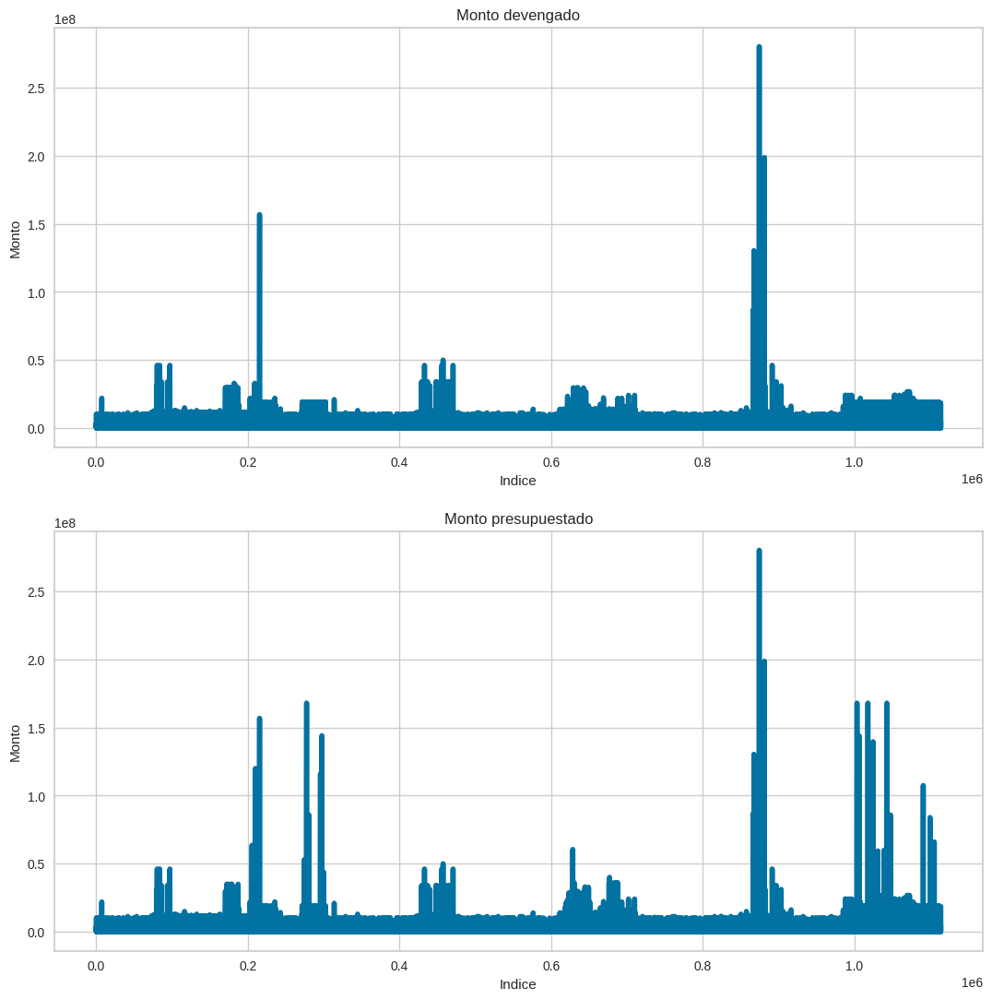

In [48]:
fig, axs = plt.subplots(2, figsize=(13, 13))

axs[0].set_title('Monto devengado')
axs[0].plot(df_nomina_funcionario.index, df_nomina_funcionario["montoDevengado"], linewidth = 4)
axs[0].set_xlabel("Indice")
axs[0].set_ylabel("Monto")

axs[1].set_title('Monto presupuestado')
axs[1].plot(df_nomina_funcionario.index, df_nomina_funcionario["montoPresupuestado"], linewidth = 4)
axs[1].set_xlabel("Indice")
axs[1].set_ylabel("Monto")

plt.show()


**Graficamos las variables categóricas del DataFrame de la nómina de funcionarios**

*Entrada: número de columnas, tamaño del gráfico, título de cada subgráfico, columna del DataFrame de la nómina de funcionarios a utilizarse para el eje x, numero de bins, etiqueta para el eje x e y, grado de rotación de la etiqueta X*

*Salida: subgráficos de histogramas*

*   [subset_data](https://pandas.pydata.org/docs/getting_started/intro_tutorials/03_subset_data.html)
*   [pyplot](https://matplotlib.org/stable/tutorials/pyplot.html)
*   [hist](https://matplotlib.org/stable/gallery/statistics/hist.html#)



<ipython-input-49-afebc400f080>:7: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[0].set_xticklabels(axs[0].get_xticklabels(), rotation=45)
<ipython-input-49-afebc400f080>:13: UserWarning: FixedFormatter should only be used together with FixedLocator
  axs[1].set_xticklabels(axs[1].get_xticklabels(), rotation=45)


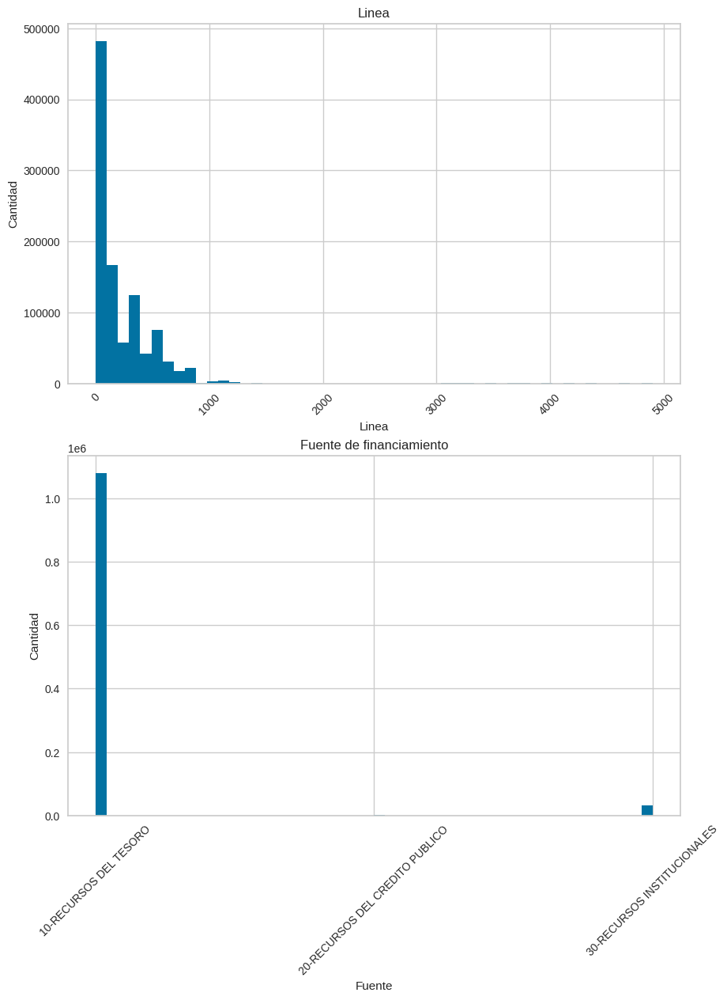

In [49]:
fig, axs = plt.subplots(2, figsize=(10, 13))

axs[0].set_title('Linea')
axs[0].hist(df_nomina_funcionario["linea"], bins=50)
axs[0].set_xlabel("Linea")
axs[0].set_ylabel("Cantidad")
axs[0].set_xticklabels(axs[0].get_xticklabels(), rotation=45)

axs[1].set_title('Fuente de financiamiento')
axs[1].hist(df_nomina_funcionario["fuenteFinanciamiento"], bins=50)
axs[1].set_xlabel("Fuente")
axs[1].set_ylabel("Cantidad")
axs[1].set_xticklabels(axs[1].get_xticklabels(), rotation=45)

plt.show()

**Graficamos las variables categóricas del DataFrame de la nómina de funcionarios**

*Entrada: número de columnas, tamaño del gráfico, columna del DataFrame de la nómina de funcionarios a utilizarse para el eje x, etiqueta para el eje x e y*

*Salida: subgráficos de histogramas*

*   [subset_data](https://pandas.pydata.org/docs/getting_started/intro_tutorials/03_subset_data.html)
*   [pyplot](https://matplotlib.org/stable/tutorials/pyplot.html)
*   [hist](https://matplotlib.org/stable/gallery/statistics/hist.html#)


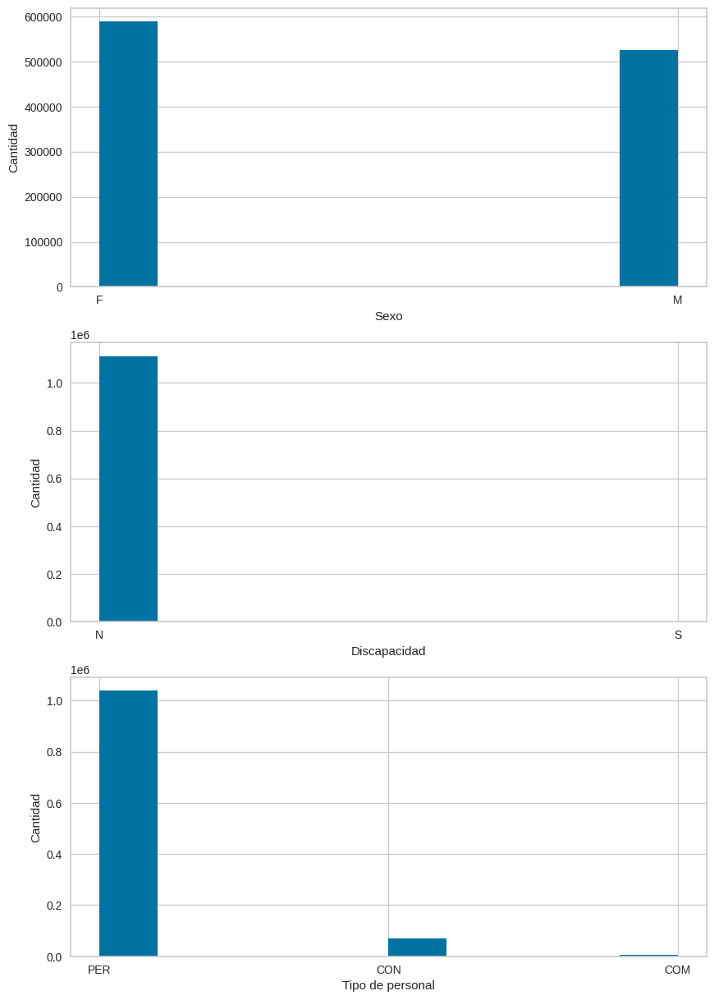

In [50]:
fig, axs = plt.subplots(3, figsize=(10, 15))

axs[0].hist(df_nomina_funcionario["sexo"])
axs[0].set_xlabel("Sexo")
axs[0].set_ylabel("Cantidad")

axs[1].hist(df_nomina_funcionario["discapacidad"])
axs[1].set_xlabel("Discapacidad")
axs[1].set_ylabel("Cantidad")

axs[2].hist(df_nomina_funcionario["tipoPersonal"])
axs[2].set_xlabel("Tipo de personal")
axs[2].set_ylabel("Cantidad")

plt.show()

## 1.8 Mapa de calor de las variables redundantes

**Creo un listado de las variables redundantes del DataFrame de la nómina de funcionarios**

*Entrada: nombre de las variables redundantes del DataFrame de la nómina de funcionarios*

*Salida: lista de variables redundantes del DataFrame de la nómina de funcionarios*


*   [list](https://docs.python.org/3/library/functions.html#func-list)



In [51]:
list_var_redundantes = ["codigoNivel", "descripcionNivel", "nivelAbr", "codigoEntidad", "descripcionEntidad", "entidadAbr", "codigoPrograma", "descripcionPrograma", "programaAbr", "codigoProyecto", "descripcionProyecto", "proyectoAbr", "codigoUnidadResponsable", "descripcionUnidadResponsable", "unidadAbr", "codigoObjetoGasto", "conceptoGasto"]
list_var_redundantes


['codigoNivel',
 'descripcionNivel',
 'nivelAbr',
 'codigoEntidad',
 'descripcionEntidad',
 'entidadAbr',
 'codigoPrograma',
 'descripcionPrograma',
 'programaAbr',
 'codigoProyecto',
 'descripcionProyecto',
 'proyectoAbr',
 'codigoUnidadResponsable',
 'descripcionUnidadResponsable',
 'unidadAbr',
 'codigoObjetoGasto',
 'conceptoGasto']

**Creo un listado de las variables redundantes que sean numéricas del Dataframe de la nómina de funcionarios**

*Entrada: lista de las variables redundantes del Dataframe de la nómina de funcionarios*

*Salida: lista de variables redundantes que son numéricas (enteros y flotantes) del Dataframe de la nómina de funcionarios*


*   [list](https://docs.python.org/3/library/functions.html#func-list)


*   [dtypes](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.dtypes.html)
*   [list](https://docs.python.org/3/library/functions.html#func-list)



In [52]:
list_var_numericas = [variable for variable in list_var_redundantes if df_nomina_funcionario[variable].dtypes in ('int64', 'float64')]
list_var_numericas

['codigoNivel',
 'codigoEntidad',
 'codigoPrograma',
 'codigoProyecto',
 'codigoUnidadResponsable',
 'codigoObjetoGasto']

**Creo un listado de las variables redundantes que sean categóricas del Dataframe de la nómina de funcionarios**

*Entrada: lista de las variables redundantes del Dataframe de la nómina de funcionarios*

*Salida: lista de las variables redundantes que son categóricas del Dataframe de la nómina de funcionarios*


*   [dtypes](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.dtypes.html)
*   [list](https://docs.python.org/3/library/functions.html#func-list)


In [53]:
list_var_categoricas = [variable for variable in list_var_redundantes if variable not in list_var_numericas]
list_var_categoricas

['descripcionNivel',
 'nivelAbr',
 'descripcionEntidad',
 'entidadAbr',
 'descripcionPrograma',
 'programaAbr',
 'descripcionProyecto',
 'proyectoAbr',
 'descripcionUnidadResponsable',
 'unidadAbr',
 'conceptoGasto']

**Codifico los valores de las variables no numéricas del DataFrame de la nómina de funcionarios a valores numéricos**

Método: codificación basada en frecuencia

*Entrada: lista de variables no numéricas, DataFrame de la nómina de funcionarios*

*Salida: dataframe de la nómina de funcionarios que contiene las variables transformadas en valores numéricos*

*   [category_encoders](https://contrib.scikit-learn.org/category_encoders/count.html)
*   [head](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.head.html)



In [54]:
countencoder = CountEncoder(cols=list_var_categoricas)

df_countencoder_var_no_numericas = countencoder.fit_transform(df_nomina_funcionario[list_var_categoricas])
df_nomina_funcionario[list_var_categoricas] = df_countencoder_var_no_numericas

df_nomina_funcionario[list_var_categoricas].head()

,descripcionNivel,nivelAbr,descripcionEntidad,entidadAbr,descripcionPrograma,programaAbr,descripcionProyecto,proyectoAbr,descripcionUnidadResponsable,unidadAbr,conceptoGasto
0,984836,984836,606176,606176,1024288,937028,233705,233705,455573,455573,632202
1,984836,984836,606176,606176,1024288,937028,140980,141697,140980,141719,83450
2,984836,984836,606176,606176,1024288,937028,140980,141697,140980,141719,83450
3,984836,984836,606176,606176,1024288,937028,207290,207290,455573,455573,632202
4,984836,984836,606176,606176,1024288,937028,207290,207290,455573,455573,632202


**Mapa de calor de las variables redundantes del Dataframe de la nómina de funcionario**

*Entrada: matriz de correlación generado a partir de la unión de la lista de variables numéricas y variables categóricas del Dataframe de la nómina de funcionario*

*Salida: mapa de calor que representa las correlaciones contenidas en la matriz de correlación*

*   [list](https://docs.python.org/3/library/functions.html#func-list)
*   [subset_data](https://pandas.pydata.org/docs/getting_started/intro_tutorials/03_subset_data.html)
*   [corr](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.corr.html)
*   [figure](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.figure.html)
*   [heatmap](https://seaborn.pydata.org/generated/seaborn.heatmap.htmlv)


<Axes: >

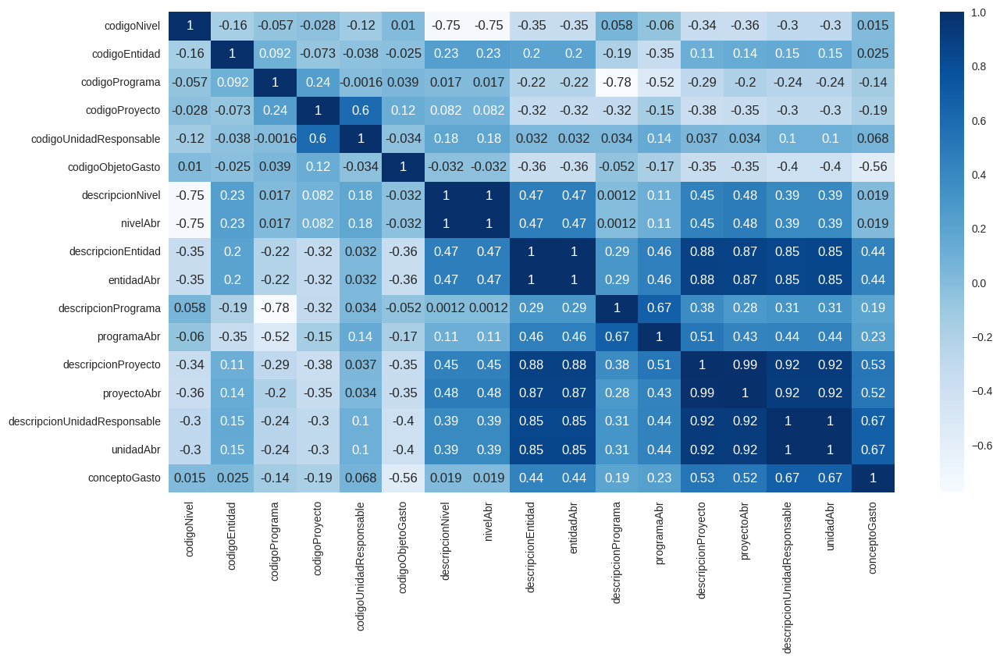

In [55]:
corr_df = df_nomina_funcionario[list_var_numericas + list_var_categoricas].corr()
plt.figure(figsize=(15,8))
sns.heatmap(corr_df, annot=True, cmap='Blues')

**Observación 1.8.1**

> Con este mapa de calor podemos reconfirmar todas las observaciones realizadas en el punto 1.6


## 1.9 Mapa de calor de las variables numéricas, categóricas y de alta cardinalidad

**Creo un listado de las variables numéricas y con alta cardinalidad (solo aquellas permitidas) del DataFrame de la nómina de funcionarios**

*Entrada: lista de variables que poseen cardinalidad 1, redundantes y las de alta cardinalidad irrelevantes a excluir*

*Salida: lista de variables del Dataframe de la nómina de funcionarios sin las  variables que poseen cardinalidad 1, redundantes y las de alta cardinalidad irrelevantes*

*   [list](https://docs.python.org/3/library/functions.html#func-list)

In [56]:
list_atributos = [atributo for atributo in atributos if atributo not in list_constantes and atributo not in list_var_redundantes and atributo not in list_var_alta_cardinalidad_irrelevantes]
list_atributos

['fuenteFinanciamiento',
 'linea',
 'sexo',
 'discapacidad',
 'codigoCategoria',
 'cargo',
 'horasCatedra',
 'fechaIngreso',
 'tipoPersonal',
 'lugar',
 'montoPresupuestado',
 'montoDevengado']

**Creo un listado de las variables numéricas del Dataframe de la nómina de funcionarios**

*Entrada: lista de variables del Dataframe de la nómina de funcionarios sin las variables que poseen cardinalidad 1, redundantes y las de alta cardinalidad irrelevantes*

*Salida: lista de variables numéricas (excluyendo horasCatedra) del Dataframe de la nómina de funcionarios*

*   [dtypes](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.dtypes.html)
*   [list](https://docs.python.org/3/library/functions.html#func-list)


In [57]:
list_atributos_numericos = [variable for variable in list_atributos if df_nomina_funcionario[variable].dtypes in ('int64', 'float64')]
list_atributos_numericos.remove('horasCatedra')
list_atributos_numericos

['linea', 'montoPresupuestado', 'montoDevengado']

**Creo un listado de las variables categóricas del Dataframe de la nómina de funcionarios**

*Entrada: lista de variables del Dataframe de la nómina de funcionarios sin las variables que poseen cardinalidad 1, redundantes y las de alta cardinalidad irrelevantes*

*Salida: lista de variables categóricas (cadenas/texto) del Dataframe de la nómina de funcionarios*

*   [dtypes](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.dtypes.html)
*   [list](https://docs.python.org/3/library/functions.html#func-list)

In [58]:
list_atributos_no_numericas = [variable for variable in list_atributos if df_nomina_funcionario[variable].dtypes not in ('int64', 'float64')]
list_atributos_no_numericas

['fuenteFinanciamiento',
 'sexo',
 'discapacidad',
 'codigoCategoria',
 'cargo',
 'fechaIngreso',
 'tipoPersonal',
 'lugar']

**Codifico los valores de las variables no numéricas del DataFrame de la nómina de funcionarios a valores numéricos**

Método: codificación basada en frecuencia

*Entrada: lista de variables no numéricas, DataFrame de la nómina de funcionarios*

*Salida: dataframe de la nómina de funcionarios que contiene las variables transformadas en valores numéricos*

*   [category_encoders](https://contrib.scikit-learn.org/category_encoders/count.html)
*   [head](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.head.html)

In [59]:
countencoder = CountEncoder(cols=list_atributos_no_numericas)

df_countencoder_var_no_numericas = countencoder.fit_transform(df_nomina_funcionario[list_atributos_no_numericas])
df_nomina_funcionario[list_atributos_no_numericas] = df_countencoder_var_no_numericas

df_nomina_funcionario[list_atributos_no_numericas].head()

,fuenteFinanciamiento,sexo,discapacidad,codigoCategoria,cargo,fechaIngreso,tipoPersonal,lugar
0,1079965,589153,1112970,589,1136,35847,1038998,1109117
1,1079965,589153,1112970,126453,116967,35847,1038998,1109117
2,1079965,589153,1112970,126453,116967,35847,1038998,1109117
3,1079965,589153,1112970,126453,7879,4174,1038998,1109117
4,1079965,589153,1112970,126453,7879,4174,1038998,1109117


**Mapa de calor de las variables numéricas, categóricas y de alta cardinalidad del Dataframe de la nómina de funcionario**

*Entrada: matriz de correlación generado a partir de la unión de la lista de variables numéricas y variables categóricas del Dataframe de la nómina de funcionario*

*Salida: mapa de calor que representa las correlaciones contenidas en la matriz de correlación*

*   [list](https://docs.python.org/3/library/functions.html#func-list)
*   [subset_data](https://pandas.pydata.org/docs/getting_started/intro_tutorials/03_subset_data.html)
*   [corr](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.corr.html)
*   [figure](https://matplotlib.org/stable/api/_as_gen/matplotlib.pyplot.figure.html)
*   [heatmap](https://seaborn.pydata.org/generated/seaborn.heatmap.htmlv)

<Axes: >

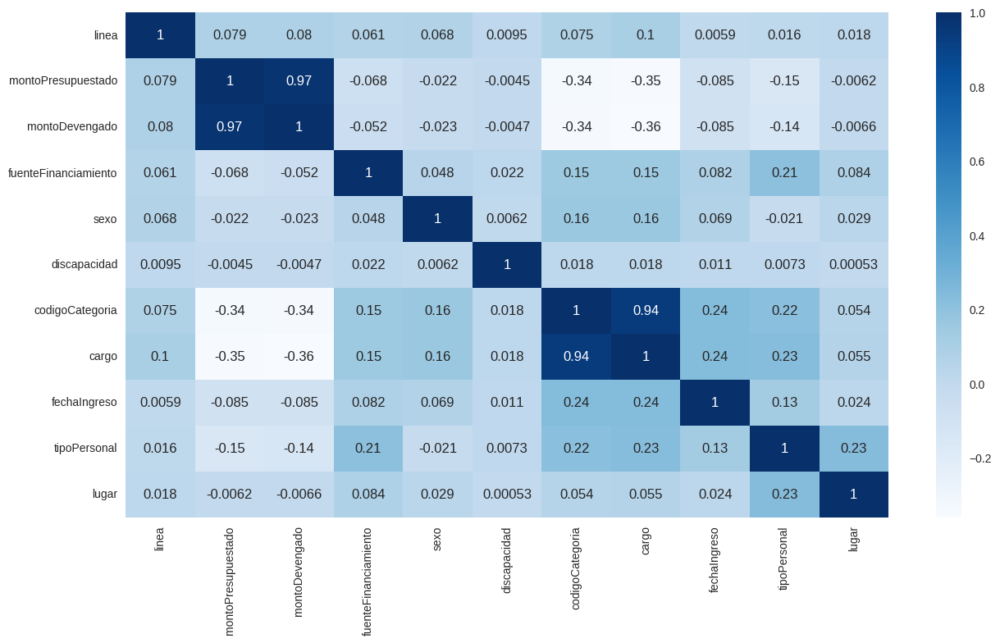

In [60]:
corr_df = df_nomina_funcionario[list_atributos_numericos + list_atributos_no_numericas].corr()
plt.figure(figsize=(15,8))
sns.heatmap(corr_df, annot=True, cmap='Blues')

**Observacion 1.9.1**

> Las variables montoPresupuestado y montoDevengado tienen una alta correlación, se debe seleccionar una de ellas y eliminar la otra. Misma situación ocurre con las variables codigoCategoria y cargo. Estas variables con alta correlación serán tratadas en el punto 2, en la sección de Eliminación de filas y variables. La eliminación de este tipo de variables ayuda a simplificar el modelo y evitar la redundancia de información.

> Variables seleccionadas: montoDevengado y cargo.

# 2.Preprocesamiento de datos

**Creo un listado de las variables del DataFrame de la nómina de funcionarios preseleccionadas de acuerdo con las siguientes observaciones:**
*   1.6.1
*   1.6.2
*   1.6.3
*   1.6.4
*   1.6.5
*   1.6.6
*   1.6.7
*   1.6.8
*   1.6.9
*   1.6.10
*   1.9.1

*Entrada: nombre de las variables preseleccionadas*

*Salida: listado de variables preseleccionadas*

*   [list](https://docs.python.org/3/library/functions.html#func-list)



In [61]:
list_var_pre_seleccionadas = ["codigoNivel", "descripcionEntidad", "descripcionPrograma", "descripcionProyecto",  "descripcionUnidadResponsable", "codigoObjetoGasto", "montoDevengado", "cargo"]
list_var_pre_seleccionadas

['codigoNivel',
 'descripcionEntidad',
 'descripcionPrograma',
 'descripcionProyecto',
 'descripcionUnidadResponsable',
 'codigoObjetoGasto',
 'montoDevengado',
 'cargo']

## 2.1 Eliminacion de filas y variables

**Elimino las filas duplicadas del DataFrame de la nómina de funcionarios de acuerdo con la observación 1.1.1**

*Salida: dataframe de la nómina de funcionarios sin filas duplicadas*

*   [drop_duplicates](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.drop_duplicates.html)
*   [head](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.head.html)


In [62]:
df_pre_nomina_funcionario = df_pre_nomina_funcionario.drop_duplicates()
df_pre_nomina_funcionario.head()

,anio,mes,codigoNivel,descripcionNivel,codigoEntidad,descripcionEntidad,codigoPrograma,descripcionPrograma,codigoSubprograma,descripcionSubprograma,...,montoDevengado,mesCorte,anioCorte,fechaCorte,nivelAbr,entidadAbr,programaAbr,subprogramaAbr,proyectoAbr,unidadAbr
0,2023,7,12,12-PODER EJECUTIVO,7,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,1,001 - PROGRAMA CENTRAL,0,0 - *,...,3632977,9,2023,2023-09-05,PODER EJECUTIVO,MEC,PC,*,BSETCEEBYEM,VEPAGE
1,2023,7,12,12-PODER EJECUTIVO,7,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,1,001 - PROGRAMA CENTRAL,0,0 - *,...,698249,9,2023,2023-09-05,PODER EJECUTIVO,MEC,PC,*,AG,DGA
2,2023,7,12,12-PODER EJECUTIVO,7,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,1,001 - PROGRAMA CENTRAL,0,0 - *,...,227520,9,2023,2023-09-05,PODER EJECUTIVO,MEC,PC,*,AG,DGA
3,2023,7,12,12-PODER EJECUTIVO,7,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,1,001 - PROGRAMA CENTRAL,0,0 - *,...,3632977,9,2023,2023-09-05,PODER EJECUTIVO,MEC,PC,*,BSEPSCEEB,VEPAGE
5,2023,7,12,12-PODER EJECUTIVO,7,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,1,001 - PROGRAMA CENTRAL,0,0 - *,...,240000,9,2023,2023-09-05,PODER EJECUTIVO,MEC,PC,*,AG,DGA


**Elimino las variables con valores unicos del DataFrame de la nómina de funcionarios de acuerdo con la observación 1.4.1**

*Entrada: lista de variables con valores unicos*

*Salida: dataFrame de la nómina de funcionarios sin las variables con valores unicos*

*   [drop](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.drop.html)
*   [head](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.head.html)


In [63]:
df_pre_nomina_funcionario = df_pre_nomina_funcionario.drop(columns=list_constantes)
df_pre_nomina_funcionario.head()

,codigoNivel,descripcionNivel,codigoEntidad,descripcionEntidad,codigoPrograma,descripcionPrograma,codigoProyecto,descripcionProyecto,codigoUnidadResponsable,descripcionUnidadResponsable,...,fechaIngreso,tipoPersonal,lugar,montoPresupuestado,montoDevengado,nivelAbr,entidadAbr,programaAbr,proyectoAbr,unidadAbr
0,12,12-PODER EJECUTIVO,7,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,1,001 - PROGRAMA CENTRAL,4,004-BRINDAR SERVICIO EDUCATIVO EN EL TERCER CI...,43,43-VICEMINISTERIO DE EDUCACIÓN BÁSICA,...,2000-01-01,PER,NaN,3632977,3632977,PODER EJECUTIVO,MEC,PC,BSETCEEBYEM,VEPAGE
1,12,12-PODER EJECUTIVO,7,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,1,001 - PROGRAMA CENTRAL,1,001- GESTIÓN ADMINISTRATIVA INSTITUCIONAL,4,4-DIRECCION GENERAL DE ADMINISTRACION Y FINANZAS,...,2000-01-01,PER,NaN,698249,698249,PODER EJECUTIVO,MEC,PC,AG,DGA
2,12,12-PODER EJECUTIVO,7,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,1,001 - PROGRAMA CENTRAL,1,001- GESTIÓN ADMINISTRATIVA INSTITUCIONAL,4,4-DIRECCION GENERAL DE ADMINISTRACION Y FINANZAS,...,2000-01-01,PER,NaN,227520,227520,PODER EJECUTIVO,MEC,PC,AG,DGA
3,12,12-PODER EJECUTIVO,7,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,1,001 - PROGRAMA CENTRAL,3,003-BRINDAR SERVICIO EDUCATIVO EN PRIMER Y SEG...,43,43-VICEMINISTERIO DE EDUCACIÓN BÁSICA,...,2007-01-12,PER,NaN,3632977,3632977,PODER EJECUTIVO,MEC,PC,BSEPSCEEB,VEPAGE
5,12,12-PODER EJECUTIVO,7,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,1,001 - PROGRAMA CENTRAL,1,001- GESTIÓN ADMINISTRATIVA INSTITUCIONAL,4,4-DIRECCION GENERAL DE ADMINISTRACION Y FINANZAS,...,2007-01-12,PER,NaN,240000,240000,PODER EJECUTIVO,MEC,PC,AG,DGA


**Elimino las variables con alta cardinalidad irrelevantes del DataFrame de la nómina de funcionarios de acuerdo con la observación 1.5.1**

*Entrada: lista de variables con alta cardinalidad irrelevantes*

*Salida: dataFrame de la nómina de funcionarios sin las variables con alta cardinalidad irrelevantes*

*   [drop](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.drop.html)
*   [head](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.head.html)


In [64]:
df_pre_nomina_funcionario = df_pre_nomina_funcionario.drop(columns=list_var_alta_cardinalidad_irrelevantes)
df_pre_nomina_funcionario.head()

,codigoNivel,descripcionNivel,codigoEntidad,descripcionEntidad,codigoPrograma,descripcionPrograma,codigoProyecto,descripcionProyecto,codigoUnidadResponsable,descripcionUnidadResponsable,...,fechaIngreso,tipoPersonal,lugar,montoPresupuestado,montoDevengado,nivelAbr,entidadAbr,programaAbr,proyectoAbr,unidadAbr
0,12,12-PODER EJECUTIVO,7,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,1,001 - PROGRAMA CENTRAL,4,004-BRINDAR SERVICIO EDUCATIVO EN EL TERCER CI...,43,43-VICEMINISTERIO DE EDUCACIÓN BÁSICA,...,2000-01-01,PER,NaN,3632977,3632977,PODER EJECUTIVO,MEC,PC,BSETCEEBYEM,VEPAGE
1,12,12-PODER EJECUTIVO,7,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,1,001 - PROGRAMA CENTRAL,1,001- GESTIÓN ADMINISTRATIVA INSTITUCIONAL,4,4-DIRECCION GENERAL DE ADMINISTRACION Y FINANZAS,...,2000-01-01,PER,NaN,698249,698249,PODER EJECUTIVO,MEC,PC,AG,DGA
2,12,12-PODER EJECUTIVO,7,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,1,001 - PROGRAMA CENTRAL,1,001- GESTIÓN ADMINISTRATIVA INSTITUCIONAL,4,4-DIRECCION GENERAL DE ADMINISTRACION Y FINANZAS,...,2000-01-01,PER,NaN,227520,227520,PODER EJECUTIVO,MEC,PC,AG,DGA
3,12,12-PODER EJECUTIVO,7,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,1,001 - PROGRAMA CENTRAL,3,003-BRINDAR SERVICIO EDUCATIVO EN PRIMER Y SEG...,43,43-VICEMINISTERIO DE EDUCACIÓN BÁSICA,...,2007-01-12,PER,NaN,3632977,3632977,PODER EJECUTIVO,MEC,PC,BSEPSCEEB,VEPAGE
5,12,12-PODER EJECUTIVO,7,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,1,001 - PROGRAMA CENTRAL,1,001- GESTIÓN ADMINISTRATIVA INSTITUCIONAL,4,4-DIRECCION GENERAL DE ADMINISTRACION Y FINANZAS,...,2007-01-12,PER,NaN,240000,240000,PODER EJECUTIVO,MEC,PC,AG,DGA


**Elimino las variables redundantes que no fueron seleccionadas del DataFrame de la nómina de funcionarios de acuerdo con las observaciones del 1.6.1 al 1.6.10**

*Entrada: lista de variables redundantes que no fueron seleccionadas*

*Salida: dataframe de la nómina de funcionarios sin las variables redundantes que no fueron seleccionadas*

*   [list](https://docs.python.org/3/library/functions.html#func-list)
*   [drop](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.drop.html)
*   [head](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.head.html)


In [65]:
list_var_redundantes_a_excluir = [variable for variable in list_var_redundantes if variable not in list_var_pre_seleccionadas]
df_pre_nomina_funcionario = df_pre_nomina_funcionario.drop(columns=list_var_redundantes_a_excluir)
df_pre_nomina_funcionario.head()

,codigoNivel,descripcionEntidad,descripcionPrograma,descripcionProyecto,descripcionUnidadResponsable,codigoObjetoGasto,fuenteFinanciamiento,linea,sexo,discapacidad,codigoCategoria,cargo,horasCatedra,fechaIngreso,tipoPersonal,lugar,montoPresupuestado,montoDevengado
0,12,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,001 - PROGRAMA CENTRAL,004-BRINDAR SERVICIO EDUCATIVO EN EL TERCER CI...,43-VICEMINISTERIO DE EDUCACIÓN BÁSICA,111,10-RECURSOS DEL TESORO,561.0,F,N,LCC,PROFESOR MJ III,NaN,2000-01-01,PER,NaN,3632977,3632977
1,12,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,001 - PROGRAMA CENTRAL,001- GESTIÓN ADMINISTRATIVA INSTITUCIONAL,4-DIRECCION GENERAL DE ADMINISTRACION Y FINANZAS,132,10-RECURSOS DEL TESORO,102.0,F,N,LCE,PROFESOR DE GRADO,NaN,2000-01-01,PER,NaN,698249,698249
2,12,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,001 - PROGRAMA CENTRAL,001- GESTIÓN ADMINISTRATIVA INSTITUCIONAL,4-DIRECCION GENERAL DE ADMINISTRACION Y FINANZAS,132,10-RECURSOS DEL TESORO,102.0,F,N,LCE,PROFESOR DE GRADO,NaN,2000-01-01,PER,NaN,227520,227520
3,12,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,001 - PROGRAMA CENTRAL,003-BRINDAR SERVICIO EDUCATIVO EN PRIMER Y SEG...,43-VICEMINISTERIO DE EDUCACIÓN BÁSICA,111,10-RECURSOS DEL TESORO,21.0,F,N,LCE,PROF. DE GRADO,NaN,2007-01-12,PER,NaN,3632977,3632977
5,12,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,001 - PROGRAMA CENTRAL,001- GESTIÓN ADMINISTRATIVA INSTITUCIONAL,4-DIRECCION GENERAL DE ADMINISTRACION Y FINANZAS,131,10-RECURSOS DEL TESORO,21.0,F,N,LCE,PROF. DE GRADO,NaN,2007-01-12,PER,NaN,240000,240000


**Elimino las variables con alta correlación del DataFrame de la nómina de funcionarios de acuerdo con la observación 1.9.1**

*Entrada: lista de variables con alta correlación*

*Salida: dataframe de la nómina de funcionarios sin las variables con alta correlación*

*   [list](https://docs.python.org/3/library/functions.html#func-list)
*   [drop](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.drop.html)
*   [head](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.head.html)

In [66]:
list_var_eliminar = ["montoPresupuestado", "codigoCategoria"]
df_pre_nomina_funcionario = df_pre_nomina_funcionario.drop(columns=list_var_eliminar)
df_pre_nomina_funcionario.head()

,codigoNivel,descripcionEntidad,descripcionPrograma,descripcionProyecto,descripcionUnidadResponsable,codigoObjetoGasto,fuenteFinanciamiento,linea,sexo,discapacidad,cargo,horasCatedra,fechaIngreso,tipoPersonal,lugar,montoDevengado
0,12,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,001 - PROGRAMA CENTRAL,004-BRINDAR SERVICIO EDUCATIVO EN EL TERCER CI...,43-VICEMINISTERIO DE EDUCACIÓN BÁSICA,111,10-RECURSOS DEL TESORO,561.0,F,N,PROFESOR MJ III,NaN,2000-01-01,PER,NaN,3632977
1,12,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,001 - PROGRAMA CENTRAL,001- GESTIÓN ADMINISTRATIVA INSTITUCIONAL,4-DIRECCION GENERAL DE ADMINISTRACION Y FINANZAS,132,10-RECURSOS DEL TESORO,102.0,F,N,PROFESOR DE GRADO,NaN,2000-01-01,PER,NaN,698249
2,12,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,001 - PROGRAMA CENTRAL,001- GESTIÓN ADMINISTRATIVA INSTITUCIONAL,4-DIRECCION GENERAL DE ADMINISTRACION Y FINANZAS,132,10-RECURSOS DEL TESORO,102.0,F,N,PROFESOR DE GRADO,NaN,2000-01-01,PER,NaN,227520
3,12,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,001 - PROGRAMA CENTRAL,003-BRINDAR SERVICIO EDUCATIVO EN PRIMER Y SEG...,43-VICEMINISTERIO DE EDUCACIÓN BÁSICA,111,10-RECURSOS DEL TESORO,21.0,F,N,PROF. DE GRADO,NaN,2007-01-12,PER,NaN,3632977
5,12,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,001 - PROGRAMA CENTRAL,001- GESTIÓN ADMINISTRATIVA INSTITUCIONAL,4-DIRECCION GENERAL DE ADMINISTRACION Y FINANZAS,131,10-RECURSOS DEL TESORO,21.0,F,N,PROF. DE GRADO,NaN,2007-01-12,PER,NaN,240000


## 2.2 Creación de nuevas variables

**Creo una nueva variable de antigüedad a partir de una variable existente en el Dataframe de la nómina de funcionarios**

*Entrada: dos series que contienen la fecha de ingreso y la fecha actual ambas convertidas en un tipo datetime64*

*Salida: dataframe de la nómina de funcionarios que contiene una nueva variable de antigüedad laboral expresada en meses (número entero)*

*   [to_datetime](https://pandas.pydata.org/docs/reference/api/pandas.to_datetime.html)
*   [today](https://docs.python.org/fr/3/library/datetime.html#datetime.date.today)
*   [to_period](https://pandas.pydata.org/docs/reference/api/pandas.Series.dt.to_period.html)
*   [astype](https://pandas.pydata.org/docs/reference/api/pandas.Series.astype.html)
*   [head](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.head.html)



In [67]:
df_pre_nomina_funcionario["fechaIngreso"] = pd.to_datetime(df_pre_nomina_funcionario["fechaIngreso"], format='%Y-%m-%d')
df_pre_nomina_funcionario["fechaActual"] = pd.to_datetime(dt.date.today(), format='%Y-%m-%d')

df_pre_nomina_funcionario['antiguedadMeses'] = df_pre_nomina_funcionario["fechaActual"].dt.to_period('M').astype("int64") - df_pre_nomina_funcionario["fechaIngreso"].dt.to_period('M').astype("int64")

df_pre_nomina_funcionario.head()

,codigoNivel,descripcionEntidad,descripcionPrograma,descripcionProyecto,descripcionUnidadResponsable,codigoObjetoGasto,fuenteFinanciamiento,linea,sexo,discapacidad,cargo,horasCatedra,fechaIngreso,tipoPersonal,lugar,montoDevengado,fechaActual,antiguedadMeses
0,12,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,001 - PROGRAMA CENTRAL,004-BRINDAR SERVICIO EDUCATIVO EN EL TERCER CI...,43-VICEMINISTERIO DE EDUCACIÓN BÁSICA,111,10-RECURSOS DEL TESORO,561.0,F,N,PROFESOR MJ III,NaN,2000-01-01,PER,NaN,3632977,2023-10-12,285
1,12,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,001 - PROGRAMA CENTRAL,001- GESTIÓN ADMINISTRATIVA INSTITUCIONAL,4-DIRECCION GENERAL DE ADMINISTRACION Y FINANZAS,132,10-RECURSOS DEL TESORO,102.0,F,N,PROFESOR DE GRADO,NaN,2000-01-01,PER,NaN,698249,2023-10-12,285
2,12,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,001 - PROGRAMA CENTRAL,001- GESTIÓN ADMINISTRATIVA INSTITUCIONAL,4-DIRECCION GENERAL DE ADMINISTRACION Y FINANZAS,132,10-RECURSOS DEL TESORO,102.0,F,N,PROFESOR DE GRADO,NaN,2000-01-01,PER,NaN,227520,2023-10-12,285
3,12,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,001 - PROGRAMA CENTRAL,003-BRINDAR SERVICIO EDUCATIVO EN PRIMER Y SEG...,43-VICEMINISTERIO DE EDUCACIÓN BÁSICA,111,10-RECURSOS DEL TESORO,21.0,F,N,PROF. DE GRADO,NaN,2007-01-12,PER,NaN,3632977,2023-10-12,201
5,12,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,001 - PROGRAMA CENTRAL,001- GESTIÓN ADMINISTRATIVA INSTITUCIONAL,4-DIRECCION GENERAL DE ADMINISTRACION Y FINANZAS,131,10-RECURSOS DEL TESORO,21.0,F,N,PROF. DE GRADO,NaN,2007-01-12,PER,NaN,240000,2023-10-12,201


**Elimino las variables innecesarias de tipo datetime64 del Dataframe de la nómina de funcionarios**

*Entrada: lista de variables de tipo datetime64*

*Salida: dataframe de la nómina de funcionarios sin las variables de tipo datetime64*

*   [list](https://docs.python.org/3/library/functions.html#func-list)
*   [drop](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.drop.html)
*   [head](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.head.html)


In [68]:
list_var_fecha = ["fechaIngreso", "fechaActual"]
df_pre_nomina_funcionario = df_pre_nomina_funcionario.drop(columns=list_var_fecha)
df_pre_nomina_funcionario.head()

,codigoNivel,descripcionEntidad,descripcionPrograma,descripcionProyecto,descripcionUnidadResponsable,codigoObjetoGasto,fuenteFinanciamiento,linea,sexo,discapacidad,cargo,horasCatedra,tipoPersonal,lugar,montoDevengado,antiguedadMeses
0,12,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,001 - PROGRAMA CENTRAL,004-BRINDAR SERVICIO EDUCATIVO EN EL TERCER CI...,43-VICEMINISTERIO DE EDUCACIÓN BÁSICA,111,10-RECURSOS DEL TESORO,561.0,F,N,PROFESOR MJ III,NaN,PER,NaN,3632977,285
1,12,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,001 - PROGRAMA CENTRAL,001- GESTIÓN ADMINISTRATIVA INSTITUCIONAL,4-DIRECCION GENERAL DE ADMINISTRACION Y FINANZAS,132,10-RECURSOS DEL TESORO,102.0,F,N,PROFESOR DE GRADO,NaN,PER,NaN,698249,285
2,12,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,001 - PROGRAMA CENTRAL,001- GESTIÓN ADMINISTRATIVA INSTITUCIONAL,4-DIRECCION GENERAL DE ADMINISTRACION Y FINANZAS,132,10-RECURSOS DEL TESORO,102.0,F,N,PROFESOR DE GRADO,NaN,PER,NaN,227520,285
3,12,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,001 - PROGRAMA CENTRAL,003-BRINDAR SERVICIO EDUCATIVO EN PRIMER Y SEG...,43-VICEMINISTERIO DE EDUCACIÓN BÁSICA,111,10-RECURSOS DEL TESORO,21.0,F,N,PROF. DE GRADO,NaN,PER,NaN,3632977,201
5,12,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,001 - PROGRAMA CENTRAL,001- GESTIÓN ADMINISTRATIVA INSTITUCIONAL,4-DIRECCION GENERAL DE ADMINISTRACION Y FINANZAS,131,10-RECURSOS DEL TESORO,21.0,F,N,PROF. DE GRADO,NaN,PER,NaN,240000,201


## 2.3 Tratamiento de valores faltantes

**Elimino variables con porcentaje alto de valores faltantes del DataFrame de la nómina de funcionarios de acuerdo con la observación 1.2.1**

*Entrada: lista de variables con porcentaje alto de valores faltantes del DataFrame de la nómina de funcionarios*

*Salida: dataframe de la nómina de funcionarios sin las variables con porcentaje alto de valores faltantes*

*   [list](https://docs.python.org/3/library/functions.html#func-list)
*   [drop](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.drop.html)
*   [head](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.head.html)

In [69]:
list_var_eliminar = ["lugar", "horasCatedra"]
df_pre_nomina_funcionario = df_pre_nomina_funcionario.drop(columns=list_var_eliminar)
df_pre_nomina_funcionario.head()

,codigoNivel,descripcionEntidad,descripcionPrograma,descripcionProyecto,descripcionUnidadResponsable,codigoObjetoGasto,fuenteFinanciamiento,linea,sexo,discapacidad,cargo,tipoPersonal,montoDevengado,antiguedadMeses
0,12,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,001 - PROGRAMA CENTRAL,004-BRINDAR SERVICIO EDUCATIVO EN EL TERCER CI...,43-VICEMINISTERIO DE EDUCACIÓN BÁSICA,111,10-RECURSOS DEL TESORO,561.0,F,N,PROFESOR MJ III,PER,3632977,285
1,12,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,001 - PROGRAMA CENTRAL,001- GESTIÓN ADMINISTRATIVA INSTITUCIONAL,4-DIRECCION GENERAL DE ADMINISTRACION Y FINANZAS,132,10-RECURSOS DEL TESORO,102.0,F,N,PROFESOR DE GRADO,PER,698249,285
2,12,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,001 - PROGRAMA CENTRAL,001- GESTIÓN ADMINISTRATIVA INSTITUCIONAL,4-DIRECCION GENERAL DE ADMINISTRACION Y FINANZAS,132,10-RECURSOS DEL TESORO,102.0,F,N,PROFESOR DE GRADO,PER,227520,285
3,12,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,001 - PROGRAMA CENTRAL,003-BRINDAR SERVICIO EDUCATIVO EN PRIMER Y SEG...,43-VICEMINISTERIO DE EDUCACIÓN BÁSICA,111,10-RECURSOS DEL TESORO,21.0,F,N,PROF. DE GRADO,PER,3632977,201
5,12,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,001 - PROGRAMA CENTRAL,001- GESTIÓN ADMINISTRATIVA INSTITUCIONAL,4-DIRECCION GENERAL DE ADMINISTRACION Y FINANZAS,131,10-RECURSOS DEL TESORO,21.0,F,N,PROF. DE GRADO,PER,240000,201


**Imputo valores arbitrarios a una variable con valores faltantes del DataFrame de la nómina de funcionarios de acuerdo con la observación 1.2.2**

Método: imputación de valores arbitrarios

*Entrada: diccionario cuya clave es el nombre de la variable(clave) y el valor es el valor arbitrario por imputar*

*Salida: dataframe de la nómina de funcionarios con los valores ya imputados*

*   [dictionaries](https://docs.python.org/3/tutorial/datastructures.html#dictionaries)
*   [fillna](https://pandas.pydata.org/docs/reference/api/pandas.Series.fillna.html)
*   [head](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.head.html)


In [70]:
dic_valores_inputar = {"linea": -999}
df_pre_nomina_funcionario = df_pre_nomina_funcionario.fillna(value=dic_valores_inputar)
df_pre_nomina_funcionario.head()

,codigoNivel,descripcionEntidad,descripcionPrograma,descripcionProyecto,descripcionUnidadResponsable,codigoObjetoGasto,fuenteFinanciamiento,linea,sexo,discapacidad,cargo,tipoPersonal,montoDevengado,antiguedadMeses
0,12,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,001 - PROGRAMA CENTRAL,004-BRINDAR SERVICIO EDUCATIVO EN EL TERCER CI...,43-VICEMINISTERIO DE EDUCACIÓN BÁSICA,111,10-RECURSOS DEL TESORO,561.0,F,N,PROFESOR MJ III,PER,3632977,285
1,12,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,001 - PROGRAMA CENTRAL,001- GESTIÓN ADMINISTRATIVA INSTITUCIONAL,4-DIRECCION GENERAL DE ADMINISTRACION Y FINANZAS,132,10-RECURSOS DEL TESORO,102.0,F,N,PROFESOR DE GRADO,PER,698249,285
2,12,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,001 - PROGRAMA CENTRAL,001- GESTIÓN ADMINISTRATIVA INSTITUCIONAL,4-DIRECCION GENERAL DE ADMINISTRACION Y FINANZAS,132,10-RECURSOS DEL TESORO,102.0,F,N,PROFESOR DE GRADO,PER,227520,285
3,12,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,001 - PROGRAMA CENTRAL,003-BRINDAR SERVICIO EDUCATIVO EN PRIMER Y SEG...,43-VICEMINISTERIO DE EDUCACIÓN BÁSICA,111,10-RECURSOS DEL TESORO,21.0,F,N,PROF. DE GRADO,PER,3632977,201
5,12,007-MINISTERIO DE EDUCACIÓN Y CIENCIAS,001 - PROGRAMA CENTRAL,001- GESTIÓN ADMINISTRATIVA INSTITUCIONAL,4-DIRECCION GENERAL DE ADMINISTRACION Y FINANZAS,131,10-RECURSOS DEL TESORO,21.0,F,N,PROF. DE GRADO,PER,240000,201


## 2.4 Codificación de variables

**Creo una lista de las variables no numéricas del DataFrame de la nómina de funcionarios**

*Entrada: lista de variables del DataFrame de la nómina de funcionarios*

*Salida: lista de variables no numéricas (cadenas/texto)*

*   [dtypes](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.dtypes.html)
*   [list](https://docs.python.org/3/library/functions.html#func-list)


In [71]:
list_var_no_numericas = [variable for variable in list(df_pre_nomina_funcionario.columns.values) if df_pre_nomina_funcionario[variable].dtypes not in ('int64', 'float64')]
list_var_no_numericas

['descripcionEntidad',
 'descripcionPrograma',
 'descripcionProyecto',
 'descripcionUnidadResponsable',
 'fuenteFinanciamiento',
 'sexo',
 'discapacidad',
 'cargo',
 'tipoPersonal']

**Codifico los valores de las variables no numéricas del DataFrame de la nómina de funcionarios a valores numéricos**

Método: codificación basada en frecuencia

*Entrada: lista de variables no numéricas, DataFrame de la nómina de funcionarios*

*Salida: dataframe de la nómina de funcionarios que contiene las variables transformadas en valores numéricos*

*   [category_encoders](https://contrib.scikit-learn.org/category_encoders/count.html)
*   [head](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.head.html)



In [72]:
countencoder = CountEncoder(cols=list_var_no_numericas)

df_countencoder_var_no_numericas = countencoder.fit_transform(df_pre_nomina_funcionario[list_var_no_numericas])
df_pre_nomina_funcionario[list_var_no_numericas] = df_countencoder_var_no_numericas

df_pre_nomina_funcionario.head()

,codigoNivel,descripcionEntidad,descripcionPrograma,descripcionProyecto,descripcionUnidadResponsable,codigoObjetoGasto,fuenteFinanciamiento,linea,sexo,discapacidad,cargo,tipoPersonal,montoDevengado,antiguedadMeses
0,12,369243,777720,99181,220772,111,833142,561.0,440293,864582,1085,792996,3632977,285
1,12,369243,777720,140977,140977,132,833142,102.0,440293,864582,94078,792996,698249,285
2,12,369243,777720,140977,140977,132,833142,102.0,440293,864582,94078,792996,227520,285
3,12,369243,777720,109183,220772,111,833142,21.0,440293,864582,6126,792996,3632977,201
5,12,369243,777720,140977,140977,131,833142,21.0,440293,864582,6126,792996,240000,201


## 2.5 Estandarización de variables

**Estandarizo los valores de las variables del DataFrame de la nómina de funcionarios**

Método: puntuación Z (también llamada puntuación estándar) que estandariza las características eliminando la media y escalando a la varianza unitaria.

*Entrada: dataframe de la nómina de funcionarios que contiene las variables seleccionadas*

*Salida: array de numpy que contiene una versión transformada del Dataframe de la nómina de funcionarios con los valores estandarizados*

*   [standardscaler](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html#sklearn.preprocessing.StandardScaler)





In [73]:
scaler = StandardScaler()
narray_pre_nomina_funcionario_scaled  = scaler.fit_transform(df_pre_nomina_funcionario)

**Asigno a las variables del Dataframe de la nómina de funcionarios las variables estandarizas**

*Entrada: array de numpy que contiene una versión transformada del Dataframe de la nómina de funcionarios con los valores estandarizados*

*Salida: dataframe de la nómina de funcionarios con los valores estandarizados*

*   [dataframe](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.html)
*   [head](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.head.html)

In [74]:
df_pre_nomina_funcionario = pd.DataFrame(narray_pre_nomina_funcionario_scaled, columns=df_pre_nomina_funcionario.columns)
df_pre_nomina_funcionario.head()

,codigoNivel,descripcionEntidad,descripcionPrograma,descripcionProyecto,descripcionUnidadResponsable,codigoObjetoGasto,fuenteFinanciamiento,linea,sexo,discapacidad,cargo,tipoPersonal,montoDevengado,antiguedadMeses
0,-0.297877,1.127294,0.3353,0.596886,1.408847,-0.557684,0.196393,0.722789,0.982463,0.028393,-0.735299,0.301845,0.718401,0.539917
1,-0.297877,1.127294,0.3353,1.378725,0.471884,-0.009737,0.196393,-0.075066,0.982463,0.028393,0.323345,0.301845,-0.409075,0.539917
2,-0.297877,1.127294,0.3353,1.378725,0.471884,-0.009737,0.196393,-0.075066,0.982463,0.028393,0.323345,0.301845,-0.589921,0.539917
3,-0.297877,1.127294,0.3353,0.783984,1.408847,-0.557684,0.196393,-0.215864,0.982463,0.028393,-0.677911,0.301845,0.718401,-0.003792
4,-0.297877,1.127294,0.3353,1.378725,0.471884,-0.035830,0.196393,-0.215864,0.982463,0.028393,-0.677911,0.301845,-0.585127,-0.003792


# 3.Aplicación de modelos

**Mejora en los métodos de Clustering a partir del contexto del problema**

Si ejecutamos las celdas contenidas en los puntos 3.1, 3.2, 3.3, 4.1, 4.2 y 4.3 omitiendo la celda que está a continuación veremos buenos resultados en la mayoría de las métricas menos en el [coeficiente de silueta](https://https://scikit-learn.org/stable/modules/generated/sklearn.metrics.silhouette_score.html#sklearn.metrics.silhouette_score), el cual nos dio un valor cercano a 0. Este valor es muy malo teniendo en cuenta que los valores deben estar cerca de 1 para ser considerados buenos. Los valores cercanos a 0 indican grupos superpuestos.

Teniendo en cuenta que el objetivo de aplicar Clustering a los datos de la nomina de los funcionarios públicos es responder a preguntas relacionadas con las características de los funcionarios (ejemplo: ¿Existe una discriminación entre los sexos respecto a los salarios?), se procedió a excluir aquellas variables que están más relacionadas con el Presupuesto General de la Nación. Estas variables excluidas son: descripcionPrograma, descripcionProyecto, descripcionUnidadResponsable y linea.

Como resultado de esta acción se mejoró sustancialmente el valor del coeficiente de silueta y por ende tenemos grupos mejor definidos.

*Entrada: lista de variables a ser eliminadas del Dataframe de la nómina de funcionarios*

*Salida: dataframe de la nómina de funcionarios sin las variables contenidas en la lista*

*   [list](https://docs.python.org/3/library/functions.html#func-list)
*   [drop](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.drop.html)
*   [head](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.head.html)




In [75]:
list_var_eliminar = ["descripcionPrograma", "descripcionProyecto", "descripcionUnidadResponsable", "linea"]

df_pre_nomina_funcionario = df_pre_nomina_funcionario.drop(columns=list_var_eliminar)
df_pre_nomina_funcionario.head()

,codigoNivel,descripcionEntidad,codigoObjetoGasto,fuenteFinanciamiento,sexo,discapacidad,cargo,tipoPersonal,montoDevengado,antiguedadMeses
0,-0.297877,1.127294,-0.557684,0.196393,0.982463,0.028393,-0.735299,0.301845,0.718401,0.539917
1,-0.297877,1.127294,-0.009737,0.196393,0.982463,0.028393,0.323345,0.301845,-0.409075,0.539917
2,-0.297877,1.127294,-0.009737,0.196393,0.982463,0.028393,0.323345,0.301845,-0.589921,0.539917
3,-0.297877,1.127294,-0.557684,0.196393,0.982463,0.028393,-0.677911,0.301845,0.718401,-0.003792
4,-0.297877,1.127294,-0.035830,0.196393,0.982463,0.028393,-0.677911,0.301845,-0.585127,-0.003792


## 3.1 kmeans

**Grafico el número de clústeres idóneos para el DataFrame de la nómina de funcionarios utilizando la regla del codo**

Algoritmo: kmeans

Método de inicialización: k-means++

*Entrada: algoritmo de clustering a utilizar, método de inicialización, número de veces que se ejecuta el algoritmo con diferentes semillas de centroide, un valor numérico entero para hacer que la aleatoriedad sea determinista, número máximo de iteraciones del algoritmo interno, tupla de K grupos probables y el Dataframe de la nómina de funcionarios*

*Salida: gráfico de codo que indica el número de K-grupo (eje x), el score de distorsión (eje y), adicionalmente se muestra el tiempo de entrenamiento por cada K grupo*

*   [kmeans](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html#sklearn.cluster.KMeans)
*   [elbow](https://www.scikit-yb.org/en/latest/api/cluster/elbow.html)

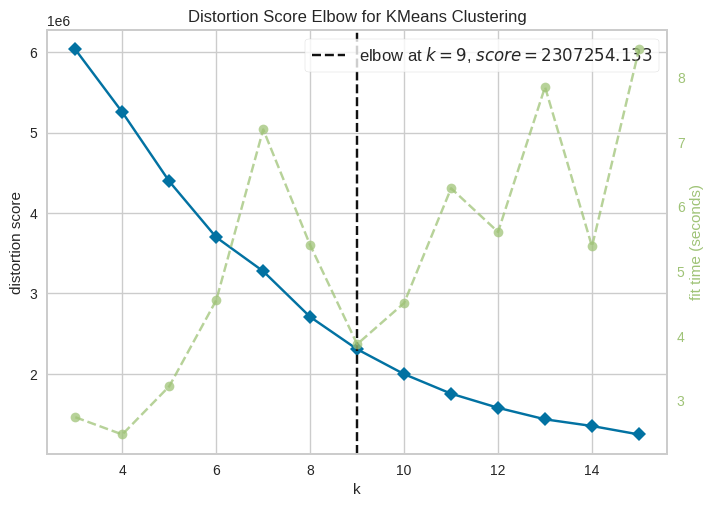

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [76]:
kmeans = KMeans(init='k-means++', n_init= 7, random_state=22, max_iter=800)
bowvisualizer = KElbowVisualizer(kmeans, k=(3,16))
bowvisualizer.fit(df_pre_nomina_funcionario)
bowvisualizer.show()

*La regla del codo consiste en graficar la varianza intra-grupo (o la suma de las distancias al cuadrado) en función de los valores de k, y elegir el punto donde se produce un cambio brusco en la pendiente, como si fuera un codo.*

**Grafico el número de clústeres idóneos para el DataFrame de la nómina de funcionarios utilizando el índice de Calinski-Harabasz**

Algoritmo: kmeans

Método de inicialización: k-means++

*Entrada: algoritmo de clustering a utilizar, método de inicialización, número de veces que se ejecuta el algoritmo con diferentes semillas de centroide, un valor numérico entero para hacer que la aleatoriedad sea determinista, número máximo de iteraciones del algoritmo interno, rango de K grupos probables y el Dataframe de la nómina de funcionarios*

*Salida: gráfica que indica el número de K-grupo (eje x), el score de Calinski Harabasz (eje y), adicionalmente se muestra un Dataframe con los valores correspondientes de numero de cluster y el score de Calinski Harabasz ordenado del mejor score al peor*

*   [kmeans](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html#sklearn.cluster.KMeans)
*   [calinski-harabasz-index](https://scikit-learn.org/stable/modules/clustering.html#calinski-harabasz-index)
*   [pyplot](https://matplotlib.org/stable/tutorials/pyplot.html)
*   [dataframe](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.html)
*   [sort_values](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.sort_values.html)
*   [list](https://docs.python.org/3/library/functions.html#func-list)
*   [dictionaries](https://docs.python.org/3/tutorial/datastructures.html#dictionaries)


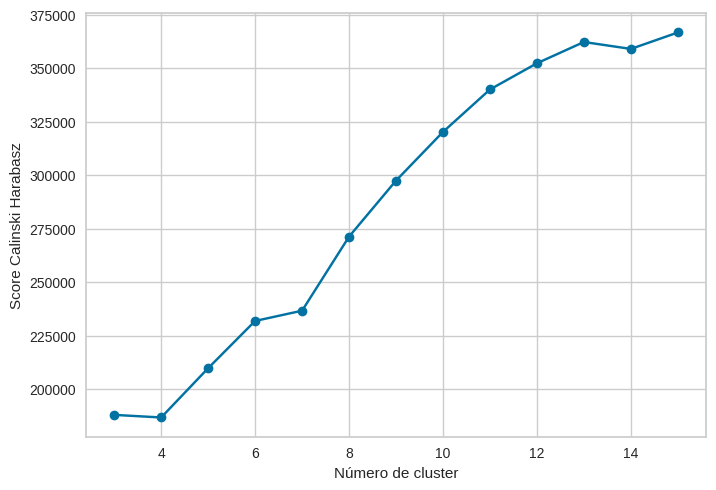

,NumeroCluster,ScoreCalinskiHarabasz
12,15,366723.134050
10,13,362267.142603
11,14,359030.932808
9,12,352324.657353
8,11,340072.994599
7,10,320223.785216
6,9,297464.079738
5,8,271270.431120
4,7,236635.584490
3,6,231836.095600


In [77]:
results = {}

for k in range(3,16):
    kmeans = KMeans(n_clusters=k, init='k-means++', n_init= 7, random_state=22, max_iter=800)
    labels = kmeans.fit_predict(df_pre_nomina_funcionario)
    score = calinski_harabasz_score(df_pre_nomina_funcionario, labels)
    results.update({k: score})

plt.plot(list(results.keys()), list(results.values()), marker = 'o')
plt.xlabel("Número de cluster")
plt.ylabel("Score Calinski Harabasz")
plt.show()

pd.DataFrame({"NumeroCluster": list(results.keys()), "ScoreCalinskiHarabasz": list(results.values())}).sort_values(by=['ScoreCalinskiHarabasz'], ascending=False)

*El índice de Calinski-Harabasz mide la relación entre la varianza intra-grupo y la varianza inter-grupo, y se busca el valor de k que maximice este índice.*

**Observación 3.1.1**

> Para el algoritmo de k-means, se seleccionaron los valores de k = 9, 13, 14 y 15, basándose en la regla del codo y el índice de Calinski-Harabasz. Estos criterios permiten evaluar la calidad de los grupos formados por el algoritmo y elegir el valor óptimo de k.

**Entreno el modelo de clustering con el DataFrame de la nómina de funcionarios**

Algoritmo: kmeans

Método de inicialización: random

*Entrada: algoritmo de clustering a utilizar, método de inicialización, número de veces que se ejecuta el algoritmo con diferentes semillas de centroide, un valor numérico entero para hacer que la aleatoriedad sea determinista, número máximo de iteraciones del algoritmo interno, rango de K grupos probables y el Dataframe de la nómina de funcionarios*

*Salida: diccionario que contiene el numero de clusters que se formaron como clave y las etiquetas(grupo) de cada punto(registro) como valor*

*   [kmeans](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html#sklearn.cluster.KMeans)
*   [list](https://docs.python.org/3/library/functions.html#func-list)
*   [dictionaries](https://docs.python.org/3/tutorial/datastructures.html#dictionaries)


In [78]:
n_clusters = [9, 13, 14, 15]
labels_kmeans = {}

for k in n_clusters:
  kmeans = KMeans(n_clusters=k, n_init= 7, random_state=22, max_iter=800)
  kmeans.fit(df_pre_nomina_funcionario)
  labels_kmeans.update({k: kmeans.labels_})

labels_kmeans

{9: array([6, 0, 0, ..., 1, 6, 1], dtype=int32),
 13: array([6, 6, 6, ..., 2, 5, 2], dtype=int32),
 14: array([ 0,  0,  0, ...,  9, 10,  3], dtype=int32),
 15: array([ 9,  9,  9, ..., 12,  4, 12], dtype=int32)}

## 3.2 BisectingKMeans

**Grafico el número de clústeres idóneos para el DataFrame de la nómina de funcionarios utilizando la regla del codo**

Algoritmo: BisectingKMeans

Método de inicialización: k-means++

*Entrada: algoritmo de clustering a utilizar, método de inicialización, número de veces que se ejecuta el algoritmo con diferentes semillas de centroide, un valor numérico entero para hacer que la aleatoriedad sea determinista, número máximo de iteraciones del algoritmo interno, tupla de K grupos probables y el Dataframe de la nómina de funcionarios*

*Salida: gráfica de codo que indica el número de K-grupo (eje x), el score de distorsión (eje y), adicionalmente se muestra el tiempo de entrenamiento por cada K grupo*

*   [elbow](https://www.scikit-yb.org/en/latest/api/cluster/elbow.html)
*   [bisectingkmeans](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.BisectingKMeans.html#sklearn.cluster.BisectingKMeans)

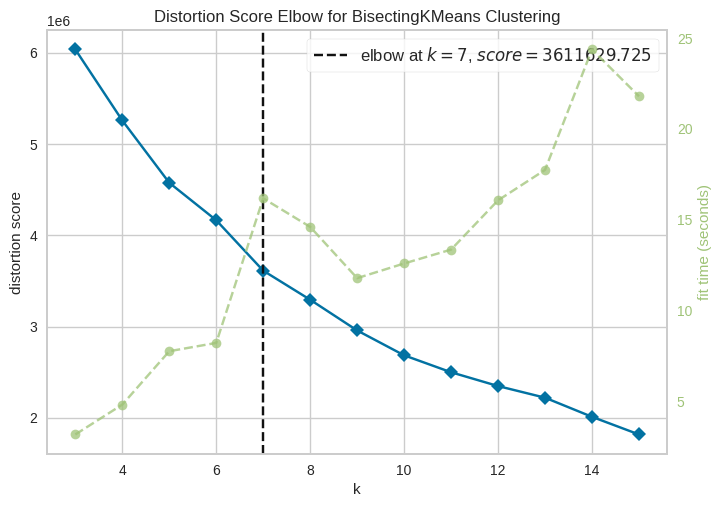

<Axes: title={'center': 'Distortion Score Elbow for BisectingKMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [79]:
bisectingkmeans = BisectingKMeans(init='k-means++', n_init= 7, random_state=22, max_iter=800)
bowvisualizer = KElbowVisualizer(bisectingkmeans, k=(3,16))
bowvisualizer.fit(df_pre_nomina_funcionario)
bowvisualizer.show()

*La regla del codo consiste en graficar la varianza intra-grupo (o la suma de las distancias al cuadrado) en función de los valores de k, y elegir el punto donde se produce un cambio brusco en la pendiente, como si fuera un codo.*

**Grafico el número de clústeres idóneos para el DataFrame de la nómina de funcionarios utilizando el índice de Calinski-Harabasz**

Algoritmo: BisectingKMeans

Método de inicialización: k-means++

*Entrada: algoritmo de clustering a utilizar, método de inicialización, número de veces que se ejecuta el algoritmo con diferentes semillas de centroide, un valor numérico entero para hacer que la aleatoriedad sea determinista, número máximo de iteraciones del algoritmo interno, rango de K grupos probables y el Dataframe de la nómina de funcionarios*

*Salida: gráfica que indica el número de K-grupo (eje x), el score de Calinski Harabasz (eje y), adicionalmente se muestra un Dataframe con los valores correspondientes de numero de cluster y el score de Calinski Harabasz ordenado del mejor score al peor*

*   [bisectingkmeans](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.BisectingKMeans.html#sklearn.cluster.BisectingKMeans)
*   [calinski-harabasz-index](https://scikit-learn.org/stable/modules/clustering.html#calinski-harabasz-index)
*   [pyplot](https://matplotlib.org/stable/tutorials/pyplot.html)
*   [dataframe](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.html)
*   [sort_values](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.sort_values.html)
*   [list](https://docs.python.org/3/library/functions.html#func-list)
*   [dictionaries](https://docs.python.org/3/tutorial/datastructures.html#dictionaries)


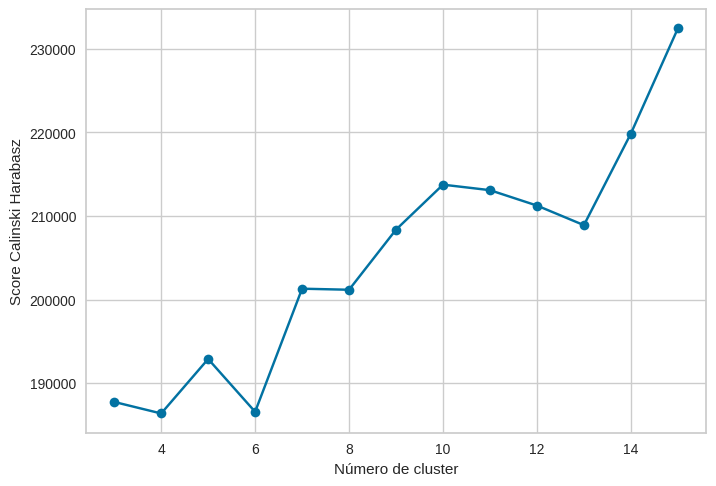

,NumeroCluster,ScoreCalinskiHarabasz
12,15,232410.855004
11,14,219842.486275
7,10,213732.662675
8,11,213074.696409
9,12,211233.944192
10,13,208891.874760
6,9,208356.894043
4,7,201293.006459
5,8,201166.219886
2,5,192885.994643


In [80]:
results = {}

for k in range(3,16):
    bisectingkmeans = BisectingKMeans(n_clusters=k, init='k-means++', n_init= 7, random_state=22, max_iter=800)
    labels = bisectingkmeans.fit_predict(df_pre_nomina_funcionario)
    score = calinski_harabasz_score(df_pre_nomina_funcionario, labels)
    results.update({k: score})

plt.plot(list(results.keys()), list(results.values()), marker = 'o')
plt.xlabel("Número de cluster")
plt.ylabel("Score Calinski Harabasz")
plt.show()

pd.DataFrame({"NumeroCluster": list(results.keys()), "ScoreCalinskiHarabasz": list(results.values())}).sort_values(by=['ScoreCalinskiHarabasz'], ascending=False)

*El índice de Calinski-Harabasz mide la relación entre la varianza intra-grupo y la varianza inter-grupo, y se busca el valor de k que maximice este índice.*

**Observación 3.1.2**

> Para el algoritmo de BisectingKMeans, se seleccionaron los valores de k = 7, 10, 14 y 15, basándose en la regla del codo y el índice de Calinski-Harabasz. Estos criterios permiten evaluar la calidad de los grupos formados por el algoritmo y elegir el valor óptimo de k.

**Entreno el modelo de clustering con el DataFrame de la nómina de funcionarios**

Algoritmo: BisectingKMeans

Método de inicialización: random

*Entrada: algoritmo de clustering a utilizar, método de inicialización, número de veces que se ejecuta el algoritmo con diferentes semillas de centroide, un valor numérico entero para hacer que la aleatoriedad sea determinista, número máximo de iteraciones del algoritmo interno, rango de K grupos probables y el Dataframe de la nómina de funcionarios*

*Salida: diccionario que contiene el numero de clusters que se formaron como clave y las etiquetas(grupo) de cada punto(registro) como valor*

*   [bisectingkmeans](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.BisectingKMeans.html#sklearn.cluster.BisectingKMeans)
*   [list](https://docs.python.org/3/library/functions.html#func-list)
*   [dictionaries](https://docs.python.org/3/tutorial/datastructures.html#dictionaries)

In [81]:
n_clusters = [7 , 10 , 14, 15]
labels_bisectingkmeans = {}

for k in n_clusters:
  bisectingkmeans = BisectingKMeans(n_clusters=k, init='k-means++', n_init= 7, random_state=22, max_iter=800)
  bisectingkmeans.fit(df_pre_nomina_funcionario)
  labels_bisectingkmeans.update({k: bisectingkmeans.labels_})

labels_bisectingkmeans

{7: array([6, 6, 6, ..., 3, 4, 3], dtype=int32),
 10: array([8, 8, 8, ..., 4, 5, 4], dtype=int32),
 14: array([12, 12, 12, ...,  7,  9,  6], dtype=int32),
 15: array([12, 12, 12, ...,  7,  9,  6], dtype=int32)}

## 3.3 Asignación de clústeres

**Agrego los resultados de los entrenamientos de los modelos de Clustering de los puntos 3.1 y 3.2 al DataFrame de la nómina de funcionarios**

*Entrada: diccionarios (dos) que contienen el número de clústeres que se formaron como clave y las etiquetas(grupo) de cada punto(registro) como valor. Un diccionario contiene los resultados de aplicar el algoritmo de KMeans y el otro el algoritmo de BisectingKMeans*

*Salida: dataframe de la nómina de funcionarios que contiene nuevas columnas cuyos valores son las etiquetas(grupo) de cada punto(registro). El nombre de las columnas indica el algoritmo y el número de clústeres que se formaron*

*   [for](https://docs.python.org/3/tutorial/controlflow.html#for-statements)
*   [dictionaries](https://docs.python.org/3/tutorial/datastructures.html#dictionaries)
*   [add_columns](https://pandas.pydata.org/docs/getting_started/intro_tutorials/05_add_columns.html#)
*   [head](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.head.html)



In [82]:
for k, label in labels_kmeans.items():
  df_pre_nomina_funcionario[f"kmeans_{k}"] = label

for k, label in labels_bisectingkmeans.items():
  df_pre_nomina_funcionario[f"bisectingkmeans_{k}"] = label

df_pre_nomina_funcionario.head()

,codigoNivel,descripcionEntidad,codigoObjetoGasto,fuenteFinanciamiento,sexo,discapacidad,cargo,tipoPersonal,montoDevengado,antiguedadMeses,kmeans_9,kmeans_13,kmeans_14,kmeans_15,bisectingkmeans_7,bisectingkmeans_10,bisectingkmeans_14,bisectingkmeans_15
0,-0.297877,1.127294,-0.557684,0.196393,0.982463,0.028393,-0.735299,0.301845,0.718401,0.539917,6,6,0,9,6,8,12,12
1,-0.297877,1.127294,-0.009737,0.196393,0.982463,0.028393,0.323345,0.301845,-0.409075,0.539917,0,6,0,9,6,8,12,12
2,-0.297877,1.127294,-0.009737,0.196393,0.982463,0.028393,0.323345,0.301845,-0.589921,0.539917,0,6,0,9,6,8,12,12
3,-0.297877,1.127294,-0.557684,0.196393,0.982463,0.028393,-0.677911,0.301845,0.718401,-0.003792,6,6,0,9,6,8,12,12
4,-0.297877,1.127294,-0.035830,0.196393,0.982463,0.028393,-0.677911,0.301845,-0.585127,-0.003792,0,6,0,9,6,8,12,12


# 4.Evaluación

**Genero un diccionario con las etiquetas(grupos) por cada algoritmo de clustering aplicado**

*Entrada: la cantidad de columnas, la cantidad de algoritmos de clustering aplicado*

*Salida: diccionario que contiene el nombre del algoritmo de clustering concatenado con el número de clústeres que se formaron como clave y las etiquetas(grupo) de cada punto(registro) como valor*

*   [columns](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.columns.html#)
*   [len](https://docs.python.org/3/library/functions.html#len)
*   [dictionaries](https://docs.python.org/3/tutorial/datastructures.html#dictionaries)


In [83]:
len_columns = len(df_pre_nomina_funcionario.columns)
cant_clustering = 8

dict_clustering = { df_pre_nomina_funcionario.iloc[: , indice].name : df_pre_nomina_funcionario.iloc[: , indice] for indice in range(len_columns - cant_clustering , len_columns)}
dict_clustering

{'kmeans_9': 0         6
 1         0
 2         0
 3         6
 4         0
          ..
 865274    6
 865275    1
 865276    1
 865277    6
 865278    1
 Name: kmeans_9, Length: 865279, dtype: int32,
 'kmeans_13': 0         6
 1         6
 2         6
 3         6
 4         6
          ..
 865274    7
 865275    7
 865276    2
 865277    5
 865278    2
 Name: kmeans_13, Length: 865279, dtype: int32,
 'kmeans_14': 0          0
 1          0
 2          0
 3          0
 4          0
           ..
 865274     9
 865275     9
 865276     9
 865277    10
 865278     3
 Name: kmeans_14, Length: 865279, dtype: int32,
 'kmeans_15': 0          9
 1          9
 2          9
 3          9
 4          9
           ..
 865274    11
 865275    11
 865276    12
 865277     4
 865278    12
 Name: kmeans_15, Length: 865279, dtype: int32,
 'bisectingkmeans_7': 0         6
 1         6
 2         6
 3         6
 4         6
          ..
 865274    4
 865275    3
 865276    3
 865277    4
 865278    3


**Selecciono solo las variables propias del Dataframe de la nómina de funcionario**

*Entrada: posiciones de las columnas a seleccionar con el formato (inicio: fin]*

*Salida: dataframe de la nómina de funcionarios sin las columnas cuyos valores son las etiquetas(grupo) de cada punto(registro)*

*   [iloc](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.iloc.html)
*   [head](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.head.html)

In [84]:
df_pre_nomina_funcionario = df_pre_nomina_funcionario.iloc[: , 0:10]
df_pre_nomina_funcionario.head()

,codigoNivel,descripcionEntidad,codigoObjetoGasto,fuenteFinanciamiento,sexo,discapacidad,cargo,tipoPersonal,montoDevengado,antiguedadMeses
0,-0.297877,1.127294,-0.557684,0.196393,0.982463,0.028393,-0.735299,0.301845,0.718401,0.539917
1,-0.297877,1.127294,-0.009737,0.196393,0.982463,0.028393,0.323345,0.301845,-0.409075,0.539917
2,-0.297877,1.127294,-0.009737,0.196393,0.982463,0.028393,0.323345,0.301845,-0.589921,0.539917
3,-0.297877,1.127294,-0.557684,0.196393,0.982463,0.028393,-0.677911,0.301845,0.718401,-0.003792
4,-0.297877,1.127294,-0.035830,0.196393,0.982463,0.028393,-0.677911,0.301845,-0.585127,-0.003792


## 4.1 Índice de Davies-Bouldin

**Grafico el Índice de Davies-Bouldin**

Métrica: Davies-Bouldin

*Entrada: dataframe de la nómina de funcionarios, diccionario que contiene el nombre del algoritmo de clustering concatenado con el número de clústeres que se formaron como clave y las etiquetas(grupo) de cada punto(registro) como valor*

*Salida: gráfica que indica el algoritmo de clustering concatenado con el número de clústeres que se formaron (eje x), el score de Davies Bouldin (eje y) y adicionalmente se muestra un Dataframe con los valores correspondientes del algoritmo de clustering concatenado con el número de clústeres que se formaron y el score de Davies Bouldin ordenado del mejor score al peor*


*   [davies_bouldin_score](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.davies_bouldin_score.html#sklearn.metrics.davies_bouldin_score)
*   [pyplot](https://matplotlib.org/stable/tutorials/pyplot.html)
*   [dataframe](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.html)
*   [sort_values](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.sort_values.html)
*   [list](https://docs.python.org/3/library/functions.html#func-list)
*   [dictionaries](https://docs.python.org/3/tutorial/datastructures.html#dictionaries)


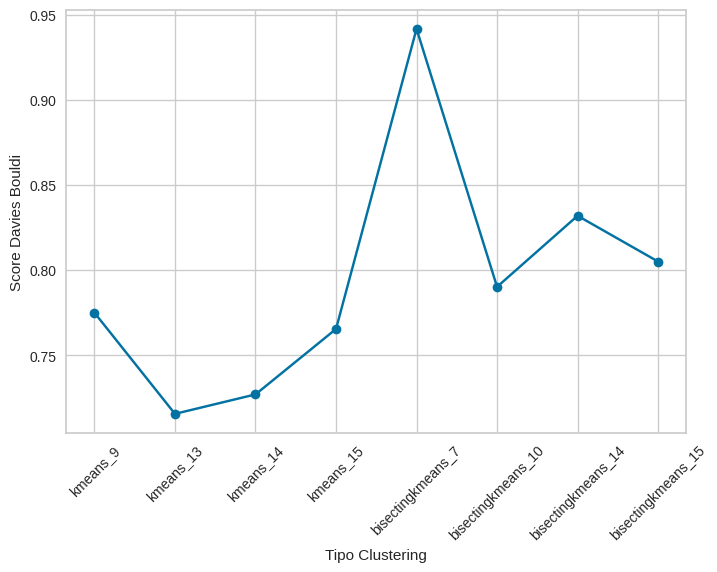

,TipoClustering,ScoreDaviesBouldin
1,kmeans_13,0.715580
2,kmeans_14,0.726998
3,kmeans_15,0.765407
0,kmeans_9,0.774955
5,bisectingkmeans_10,0.790146
7,bisectingkmeans_15,0.804989
6,bisectingkmeans_14,0.831877
4,bisectingkmeans_7,0.941612


In [85]:
dict_results = {}

for clave, valor in dict_clustering.items():
  score = davies_bouldin_score(df_pre_nomina_funcionario, valor)
  dict_results.update({clave: score})

plt.plot(list(dict_results.keys()), list(dict_results.values()), marker = 'o')
plt.xlabel("Tipo Clustering")
plt.ylabel("Score Davies Bouldi")
plt.xticks(rotation=45)
plt.show()

pd.DataFrame({"TipoClustering": list(dict_results.keys()), "ScoreDaviesBouldin": list(dict_results.values())}).sort_values(by=['ScoreDaviesBouldin'])

*El índice de Davies-Bouldin es una medida que evalúa la calidad de un algoritmo de agrupamiento, basándose en la cohesión y la separación de los grupos formados. La cohesión mide qué tan cerca están los puntos dentro de cada grupo, y la separación mide qué tan lejos están los centros de los grupos entre sí.*

*Un valor bajo del índice indica que los grupos son compactos y bien separados, mientras que un valor alto indica que los grupos se solapan o están dispersos. La mejor puntuación posible es cero, que significa que los grupos no tienen cohesión ni solapamiento1.*

**Observación 4.1.1**

> La mejor puntuación del índice Davies-Bouldin es 0.715580 que corresponde al algoritmo kmeans con K-grupos igual a 13, lo que significa que el algoritmo de agrupamiento ha logrado formar grupos relativamente coherentes y separados, pero aún hay espacio para mejorar

## 4.2 Coeficiente de silueta

**Grafico el Coeficiente de silueta**

Métrica: Coeficiente de silueta

*Entrada: dataframe de la nómina de funcionarios, diccionario que contiene el nombre del algoritmo de clustering concatenado con el número de clústeres que se formaron como clave, las etiquetas(grupo) de cada punto(registro) como valor y el tamaño de la muestra a tomar del Dataframe*

*Salida: gráfica que indica el algoritmo de clustering concatenado con el número de clústeres que se formaron (eje x), el coeficiente de siluete (eje y) y adicionalmente se muestra un Dataframe con los valores correspondientes del algoritmo de clustering concatenado con el número de clústeres que se formaron y el coeficiente de siluete ordenado del mejor coeficiente al peor*


*   [silhouette_score](https://scikit-learn.org/stable/modules/generated/sklearn.metrics.silhouette_score.html#sklearn.metrics.silhouette_score)
*   [pyplot](https://matplotlib.org/stable/tutorials/pyplot.html)
*   [dataframe](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.html)
*   [sort_values](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.sort_values.html)
*   [list](https://docs.python.org/3/library/functions.html#func-list)
*   [dictionaries](https://docs.python.org/3/tutorial/datastructures.html#dictionaries)


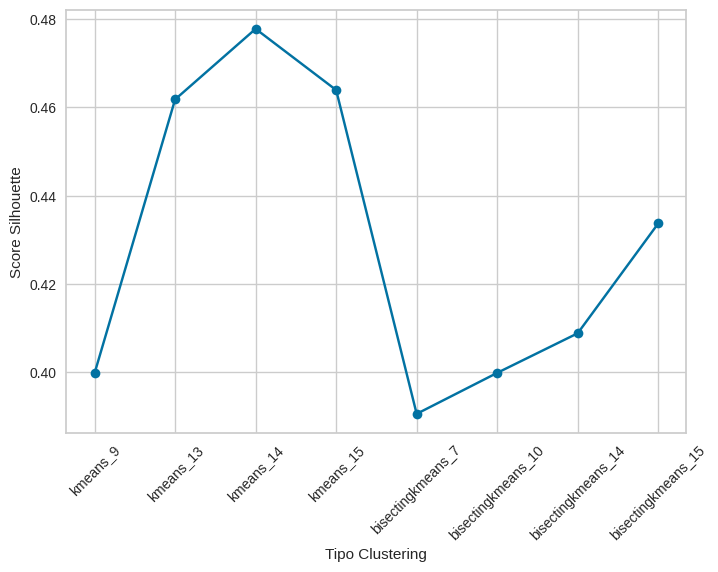

,TipoClustering,ScoreSilhouette
2,kmeans_14,0.477785
3,kmeans_15,0.463926
1,kmeans_13,0.461799
7,bisectingkmeans_15,0.433706
6,bisectingkmeans_14,0.408825
5,bisectingkmeans_10,0.399855
0,kmeans_9,0.399786
4,bisectingkmeans_7,0.390570


In [86]:
dict_results = {}

for clave, valor in dict_clustering.items():
  score = silhouette_score(df_pre_nomina_funcionario, valor, sample_size=50000)
  dict_results.update({clave: score})

plt.plot(list(dict_results.keys()), list(dict_results.values()), marker = 'o')
plt.xlabel("Tipo Clustering")
plt.ylabel("Score Silhouette")
plt.xticks(rotation=45)
plt.show()

pd.DataFrame({"TipoClustering": list(dict_results.keys()), "ScoreSilhouette": list(dict_results.values())}).sort_values(by=['ScoreSilhouette'], ascending=False)

*El coeficiente de silueta es una medida que evalúa la calidad de un algoritmo de agrupación, basándose en la cohesión y la separación de los grupos formados.*

*Un valor alto del coeficiente indica que los grupos son compactos y bien separados, mientras que un valor bajo o negativo indica que los grupos se solapan o están dispersos. El valor del coeficiente varía entre -1 y 1, siendo 1 el mejor valor posible*

**Observación 4.2.1**

> La mejor puntuación del Coeficiente de silueta es 0.477785 que corresponde al algoritmo kmeans con K-grupos igual a 14, lo que significa que el algoritmo ha logrado formar 14 grupos con una buena cohesión y separación, aunque no se ha alcanzado el valor óptimo de 1

**Observación 4.2.3**

> Para elegir el mejor modelo, se compararon los valores del coeficiente de silueta y el índice de Davies Bouldin para diferentes valores de k. En general, se busca maximizar el coeficiente de silueta y minimizar el índice de Davies Bouldin.

> Se concluyó que el mejor modelo era el de kmeans con k = 14, ya que tenía un buen balance entre ambos criterios. Esta en el top 2 del índice de Davies Bouldin y en el top 1 del coeficiente de silueta.

# 5.Visualización

**Gráfico el Coeficiente de silueta del mejor modelo de clustering evaluado**

Métrica: Coeficiente de silueta

*Entrada: algoritmo de clustering a utilizar, método de inicialización, número de veces que se ejecuta el algoritmo con diferentes semillas de centroide, un valor numérico entero para hacer que la aleatoriedad sea determinista, número máximo de iteraciones del algoritmo interno, cantidad de clústeres que se formarán, una muestra de N registro del Dataframe de la nómina de funcionarios y cadena de mapa de colores*

*Salida: gráfico del coeficiente de silueta para cada muestra en función del clúster al que pertenece, evaluando visualmente la densidad y la separación entre los clústeres*

*   [kmeans](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html#sklearn.cluster.KMeans)
*   [silhouette](https://www.scikit-yb.org/en/latest/api/cluster/silhouette.html)

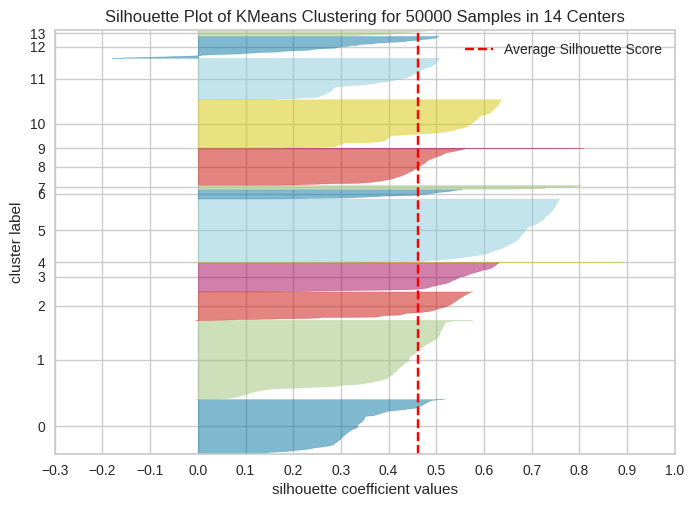

<Axes: title={'center': 'Silhouette Plot of KMeans Clustering for 50000 Samples in 14 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [87]:
kmeans = KMeans(n_clusters=14, init='k-means++', n_init= 7, random_state=22, max_iter=800)
visualizer = SilhouetteVisualizer(kmeans, colors='yellowbrick')
visualizer.fit(df_pre_nomina_funcionario.sample(50000))
visualizer.show()

*El gráfico muestra el valor del coeficiente de silueta para cada uno de los 14 grupos formados por el algoritmo k-means, así como el valor promedio para toda la muestra.*

*Se observa que el valor promedio del coeficiente de silueta para toda la muestra es 0.477785, lo que significa que la agrupación tiene una calidad moderada, aunque no óptima. Este valor se encuentra por encima del umbral de 0.4, que se considera aceptable para una buena agrupación. Sin embargo, también se nota que hay una gran variabilidad entre los valores del coeficiente para cada grupo, lo que indica que algunos grupos tienen una mejor calidad que otros.*

**Agrego el resultado del entrenamiento del mejor modelo de clustering evaluado**

*Entrada: array de numpy cuyos valores son las etiquetas(grupo) de cada punto(registro). Este array esta contenido en un diccionario al cual accedemos mediante una clave que representa la cantidad de clústeres que se formarán del mejor modelo de clustering evaluado*

*Salida: dataframe de la nómina de funcionarios que contiene una nueva columna denominada 'label' cuyos valores son las etiquetas(grupo) de cada punto(registro) del mejor modelo de clustering evaluado*

*   [dictionaries](https://docs.python.org/3/tutorial/datastructures.html#dictionaries)
*   [add_columns](https://pandas.pydata.org/docs/getting_started/intro_tutorials/05_add_columns.html#)
*   [head](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.head.html)

In [88]:
df_pre_nomina_funcionario["label"] = labels_kmeans[14]
df_pre_nomina_funcionario.head()

,codigoNivel,descripcionEntidad,codigoObjetoGasto,fuenteFinanciamiento,sexo,discapacidad,cargo,tipoPersonal,montoDevengado,antiguedadMeses,label
0,-0.297877,1.127294,-0.557684,0.196393,0.982463,0.028393,-0.735299,0.301845,0.718401,0.539917,0
1,-0.297877,1.127294,-0.009737,0.196393,0.982463,0.028393,0.323345,0.301845,-0.409075,0.539917,0
2,-0.297877,1.127294,-0.009737,0.196393,0.982463,0.028393,0.323345,0.301845,-0.589921,0.539917,0
3,-0.297877,1.127294,-0.557684,0.196393,0.982463,0.028393,-0.677911,0.301845,0.718401,-0.003792,0
4,-0.297877,1.127294,-0.035830,0.196393,0.982463,0.028393,-0.677911,0.301845,-0.585127,-0.003792,0


**Gráfico de dispersión 3D usando el Dataframe de la nómina de funcionario**

*Entrada: una muestra de N registro del Dataframe de la nómina de funcionarios, nombre de la columna del Dataframe de la nómina de funcionarios a utilizarce en el eje X, nombre de la columna del Dataframe de la nómina de funcionarios a utilizarce en el eje Y, nombre de la columna del Dataframe de la nómina de funcionarios a utilizarce en el eje Z, nombre de la columna del Dataframe de la nómina de funcionarios a utilizarce para asignar un color a los puntos, un diccionario que contiene como clave el nombre de las columnas del Dataframe utilizadas y como valor la etiqueta a asignarse, ancho y alto del del grafico*

*Salida: un gráfico de dispersión que muestra los datos del Dataframe de la nómina de funcionario en tres dimensiones*


*   [sample](https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.sample.html)
*   [scatter_3d](https://plotly.com/python-api-reference/generated/plotly.express.scatter_3d.html)

In [89]:
fig = px.scatter_3d(df_pre_nomina_funcionario.sample(216319),
                 x="antiguedadMeses",
                 y="montoDevengado",
                 z="sexo",
                 color="label",
                 labels={"montoDevengado": "Monto devengado", "antiguedadMeses": "Antiguedad", "sexo": "Sexo"},
                 width=1200,
                 height=900)
fig.show()

**Observación 5.1.1**

>En el análisis de una muestra aleatoria del 25% de los datos, se puede visualizar un caso particular en el grupo 6, donde algunos hombres (sexo = -1.017850) tenían ingresos más altos que algunas mujeres (sexo = 0.982463) del mismo grupo, a pesar de tener una antigüedad laboral muy similar. Este hecho podría sugerir una leve diferencia salarial por género en este grupo, aunque se trata de una cantidad muy pequeña de puntos y se requiere un estudio más profundo para confirmarlo

# 6.Discusión

En este cuaderno se han realizado diversas acciones para optimizar la etapa de preprocesamiento y selección de características. Entre ellas, se destacan las siguientes:
*   Eliminar filas duplicadas que puedan introducir ruido o sesgo en el análisis.
*   Descartar variables irrelevantes con alta cardinalidad que no aporten información útil para el modelo.
*   Detectar y eliminar variables redundantes que tengan una alta correlación entre sí o con otras variables.
*   Excluir variables innecesarias con una sola cardinalidad que no varíen en el conjunto de datos.
*   Codificar variables categóricas mediante técnicas adecuadas según el tipo de variable (ordinal, nominal, binaria, etc.).
*   Estandarizar variables numéricas para evitar problemas de escala o distribución.

Cada una de estas acciones se ha justificado y explicado a lo largo del cuaderno, indicando los criterios y métodos utilizados


El objetivo de esta investigación fue determinar si hay diferencias significativas en los ingresos de las personas según su sexo y su antigüedad laboral. Para ello, se analizaron los datos de los grupos formados por estas variables. Según el análisis realizado en la sección 5.1.1, no se encontraron evidencias de que exista una brecha salarial entre hombres y mujeres con niveles similares de antigüedad. Aunque se observaron algunas variaciones en los ingresos entre los grupos, estas no fueron lo suficientemente grandes como para indicar una desigualdad.

Para elegir el mejor modelo de agrupamiento entre seis opciones (tres que usan el algoritmo de kmeans y tres que usan el algoritmo de BisectingKMeans), se aplicaron dos criterios: la regla del codo y el índice de Calinski-Harabasz. Estos criterios permiten determinar el número óptimo de grupos (K) para cada algoritmo.

El modelo que obtuvo el mejor valor de K fue el que usó el algoritmo de kmeans, con un total de 14. Este modelo se evaluó con dos métricas: el coeficiente de silueta y el índice de Davies-Bouldin. El coeficiente de silueta mide cuán similar es un objeto a su propio grupo en comparación con otros grupos, y el índice de Davies-Bouldin mide la relación entre la dispersión dentro de los grupos y la separación entre ellos. Los valores obtenidos por el modelo fueron: 0.477785 para el coeficiente de silueta y 0.726998 para el índice de Davies-Bouldin.

Estos valores indican que el modelo tiene una asignación razonable, pero no óptima, de los objetos a los grupos, ya que los grupos tienen mucha dispersión o poca separación. Por lo tanto, los resultados pueden ser aceptables, pero no óptimos, para el objetivo planteado.

Para optimizar el modelo de clustering, se podrían emplear algunas técnicas de selección de atributos basadas en modelos, con el fin de identificar las variables más relevantes para el agrupamiento. Asimismo, se podrían ajustar los hiperparámetros más importantes del algoritmo, como la medida de distancia o el número máximo de iteraciones. Finalmente, se podrían comparar los resultados con otros algoritmos que utilicen el criterio de densidad para formar los clústeres, y evaluar si las métricas de calidad mejoran.